# MIRI PSF Photometry With Space_Phot

**Author**: Ori Fox<br>

**Submitted**: August, 2023<br>
**Updated**: November, 2023<br>

**Use case**: PSF Photometry on Level3 data using dedicated package Space_Phot (https://github.com/jpierel14/space_phot). Space_phot is built on Astropy's Photutils package. Unlike photutils, space_phot can be used on Level3 data. This is because has built in functionality that can generate a resampled Level3 PSF at a given detector position. Such use cases are particularly useful for faint, point source targets or deep upper limits where observers need to take advantage of the combined image stack. For a large number of bright sources, users may find space_phot to be too slow and should consider other packages, such as DOLPHOT and/or Photutils. **NOTE:** A companion notebook exists that illustrates how to use Photutils for the same Level2 data set.<br>
**Important Note**: When not to use. Due to the sensitivity of the space_phot parameters, this tool is not meant to be used for a large sample of stars (i.e., Section 5 below). If a user would like to use space_phot on more than one source, they should carefully construct a table of parameters that are carefully refined for each source.
**Data**: MIRI Data PID 1028 (Calibration Program; Single Star Visit 006 A5V dwarf 2MASSJ17430448+6655015) and MIRI Data PID 1171 (LMC; Multiple Stars).<br>
**Tools**: photutils, space_phot drizzlepac, jupyter <br>
**Cross-Instrument**: NIRCam, MIRI.<br>
**Documentation**: This notebook is part of a STScI's larger post-pipeline Data Analysis Tools Ecosystem and can be downloaded directly from the JDAT Notebook Github directory.<br>
**Pipeline Version**: JWST Pipeline<br>


## Table of contents
1. [Introduction](#intro)<br>
    1.1 [Setup](#webbpsf)<br>
    1.2 [Python imports](#py_imports)<br>
2. [Download Data](#data)<br>
3. [Bright, Single Object](#bso)<br>
    3.1 [Multiple, Level2 Files](#bso2)<br>
    3.2 [Single, Level3 Mosaicked File](#bso3)<br>
4. [Faint/Upper Limit, Single Object](#fso)<br>
    4.1 [Multiple, Level2 Files](#fso2)<br>
    4.2 [Single, Level3 Mosaicked File](#fso3)<br>
5. [Stellar Field (LMC)](#lmv)<br>
    5.1 [Multiple, Level2 Files](#lmc2)<br>
    5.2 [Single, Level3 Mosaicked File](#lmc3)<br>

1.<font color='white'>-</font>Introduction <a class="anchor" id="intro"></a>
------------------

GOALS:<br>

PSF Photometry can be obtained using:<br>

* grid of PSF models from WebbPSF<br>
* single effective PSF (ePSF) NOT YET AVAILABLE<br>
* grid of effective PSF NOT YET AVAILABLE<br>

The notebook shows:<br>

* how to obtain the PSF model from WebbPSF (or build an ePSF)<br>
* how to perform PSF photometry on the image<br>

**Data**:<br>

MIRI Data PID 1028 (Calibration Program), F770W <br>
MIRI Data PID 1171 (LMC), F560W/F770W

### 1.1<font color='white'>-</font>Setup WebbPSF and Synphot Directories<a class="anchor" id="webbpsf"></a> ###

In [1]:
import space_phot
from importlib.metadata import version
print('space-phot version : ', version('space_phot'))
print('jwst version : ', version('jwst'))



The following task in the stsci.skypac package can be run with TEAL:
                                    skymatch                                    


The following tasks in the drizzlepac package can be run with TEAL:
    astrodrizzle       config_testbed      imagefindpars           mapreg       
       photeq            pixreplace           pixtopix            pixtosky      
  refimagefindpars       resetbits          runastrodriz          skytopix      
     tweakback            tweakreg           updatenpol


Important:  Gaia archive will be intermittently unavailable due to scheduled maintenance on 13-01-2025 from 08:00 to 18:00 (CET)
space-phot version :  0.2.5
jwst version :  1.17.1


In [2]:
import os
import glob
import shutil
import requests
import tarfile
from urllib.parse import urlparse

# Set environmental variables
os.environ["WEBBPSF_PATH"] = "./webbpsf-data/webbpsf-data"
os.environ["PYSYN_CDBS"] = "./grp/redcat/trds/"

# WEBBPSF Data
boxlink = 'https://stsci.box.com/shared/static/qxpiaxsjwo15ml6m4pkhtk36c9jgj70k.gz'                                                           
boxfile = './webbpsf-data/webbpsf-data-1.0.0.tar.gz'
synphot_url = 'http://ssb.stsci.edu/trds/tarfiles/synphot5.tar.gz'
synphot_file = './synphot5.tar.gz'

webbpsf_folder = './webbpsf-data'
synphot_folder = './grp'


def download_file(url, dest_path, timeout=60):
    parsed_url = urlparse(url)
    if parsed_url.scheme not in ["http", "https"]:
        raise ValueError(f"Unsupported URL scheme: {parsed_url.scheme}")

    response = requests.get(url, stream=True, timeout=timeout)
    response.raise_for_status()
    with open(dest_path, "wb") as f:
        for chunk in response.iter_content(chunk_size=8192):
            f.write(chunk)


# Gather webbpsf files
psfExist = os.path.exists(webbpsf_folder)
if not psfExist:
    os.makedirs(webbpsf_folder)
    download_file(boxlink, boxfile)
    gzf = tarfile.open(boxfile)
    gzf.extractall(webbpsf_folder, filter='data')

# Gather synphot files
synExist = os.path.exists(synphot_folder)
if not synExist:
    os.makedirs(synphot_folder)
    download_file(synphot_url, synphot_file)
    gzf = tarfile.open(synphot_file)
    gzf.extractall('./', filter='data')

### 1.2<font color='white'>-</font>Python Imports<a class="anchor" id="py_imports"></a> ###

In [3]:
from astropy.io import fits
from astropy.nddata import extract_array
from astropy.coordinates import SkyCoord
from astropy import wcs
from astropy.table import QTable
from astropy.wcs.utils import skycoord_to_pixel
from astropy import units as u
import numpy as np
import matplotlib.pyplot as plt
from astroquery.mast import Observations
from astropy.visualization import simple_norm
import time
import math
import pandas as pd
%matplotlib inline

# JWST models
from jwst.datamodels import ImageModel

# Background and PSF Functions
from photutils.background import MMMBackground, MADStdBackgroundRMS
from photutils.detection import DAOStarFinder

2.<font color='white'>-</font>Download Data<a class="anchor" id="data"></a>
------------------

In [4]:
# Query the MAST (Mikulski Archive for Space Telescopes) database for observations
# with proposal ID 1028 and a specific filter 'F770W'
obs = Observations.query_criteria(proposal_id=1028, filters=['F770W'])

# Get a list of products associated with the located observation
plist = Observations.get_product_list(obs)

# Filter the product list to include only specific product subgroups: 'RATE', 'CAL', 'I2D', and 'ASN'
fplist = Observations.filter_products(plist, productSubGroupDescription=['CAL', 'I2D', 'ASN'])

# Download the selected products from the MAST database
Observations.download_products(fplist)

# Define source and destination directories
source_dir = 'mastDownload/JWST/'
destination_dir = 'mast/01028/'

# Create the destination directory if it doesn't exist
if not os.path.exists(destination_dir):
    os.makedirs(destination_dir)

# Use glob to find all files matching the pattern 'mastDownload/JWST/j*/jw01537*cal.fits'
files_to_copy = glob.glob(os.path.join(source_dir, 'j*/jw01028*'))

# Copy the matching files to the destination directory
for file_path in files_to_copy:
    shutil.copy(file_path, destination_dir)

 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


In [5]:
# Query the MAST (Mikulski Archive for Space Telescopes) database for observations
# with proposal ID 1171 and a specific filters 'F560W' and 'F770W'
obs = Observations.query_criteria(proposal_id=1171, filters=['F560W', 'F770W'])

# Get a list of products associated with the located observation
plist = Observations.get_product_list(obs)

# Filter the product list to include only specific product subgroups: 'RATE', 'CAL', 'I2D', and 'ASN'
fplist = Observations.filter_products(plist, productSubGroupDescription=['CAL', 'I2D', 'ASN'])
fplist

# Download the selected products from the MAST database (UNCOMMENT TO DOWNLOAD)
Observations.download_products(fplist)

# Define source and destination directories
source_dir = 'mastDownload/JWST/'
destination_dir = 'mast/01171/'

# Create the destination directory if it doesn't exist
if not os.path.exists(destination_dir):
    os.makedirs(destination_dir)

# Use glob to find all files matching the pattern 'mastDownload/JWST/j*/jw01537*cal.fits'
files_to_copy = glob.glob(os.path.join(source_dir, 'j*/jw01171*'))

# Copy the matching files to the destination directory
for file_path in files_to_copy:
    shutil.copy(file_path, destination_dir)

 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


3.<font color='white'>-</font>Bright, Single Object<a class="anchor" id="bso"></a>
------------------

The purpose of this section is to illustrate how to perform PSF photometry on a single, bright object. While aperture photometry is feasible in isolated cases, the user may find PSF photometry preferable in crowded fields or complicated backgrounds.

### 3.1<font color='white'>-</font>Multiple, Level2 Files<a class="anchor" id="bso2"></a> ###

Generally, PSF photometry for data from a space telescope is most accurately performed on pre-mosaiced data. In the case of HST, that corresponds to FLT files rather than DRZ. And in the case of JWST, this corresponds to Level2 files rather than Level3. The reason is that a mosaiced PSF changes the inherent PSF as a function of position on the detector so that there is no adequate model (theoretical or empirical) to use.<br>

In this example, we aim to fit a source simultaneously across multiple Level 2 images. A more basic approach would be to fit each Level 2 file individually and then average together the measured fluxes. However, this approach more easily corrects for bad pixels or cosmic rays that are only in one image and allows for a more accurate photometric solution by reducing the number of free parameters per source.<br>

Useful references:<br>
HST Documentation on PSF Photometry: https://www.stsci.edu/hst/instrumentation/wfc3/data-analysis/psf<br>
WFPC2 Stellar Photometry with HSTPHOT: https://ui.adsabs.harvard.edu/abs/2000PASP..112.1383D/abstract<br>
Space-Phot Documentation on Level2 Fitting: https://space-phot.readthedocs.io/en/latest/examples/plot_a_psf.html#jwst-images<br>

In [6]:
# Define Level 3 File
lvl3 = ['./mast/01028/jw01028-o006_t001_miri_f770w_i2d.fits']
lvl3

['./mast/01028/jw01028-o006_t001_miri_f770w_i2d.fits']

In [7]:
# Create Level 2 Data List from ASN files
prefix = "./mast/01028/"
asn = glob.glob(prefix+'jw01028-o006_*_image3_00004_asn.json')

with open(asn[0], "r") as fi:
    lvl2 = []
    for ln in fi:
        #print(ln)
        if ln.startswith('                    "expname":'):
            x = ln[2:].split(':')
            y = x[1].split('"')
            lvl2.append(prefix+y[1])

print(lvl2)

['./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits', './mast/01028/jw01028006001_02101_00002_mirimage_cal.fits', './mast/01028/jw01028006001_02101_00003_mirimage_cal.fits', './mast/01028/jw01028006001_02101_00004_mirimage_cal.fits']


./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits


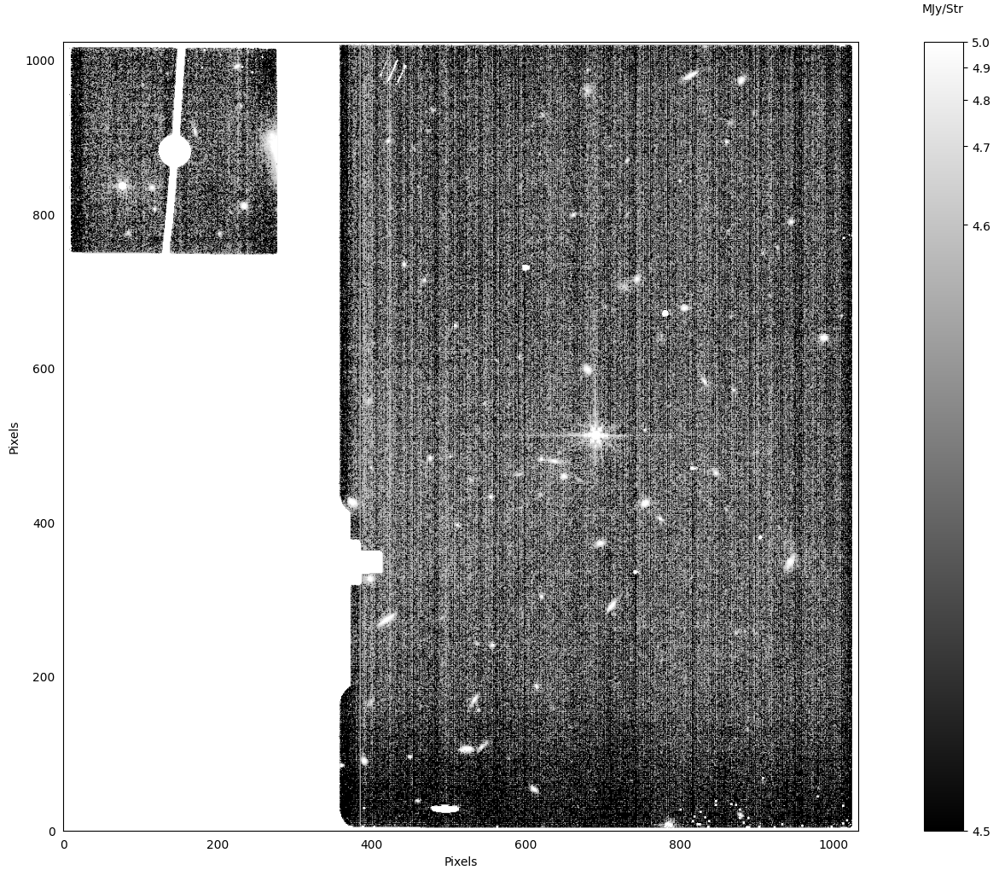

In [8]:
# Examine the First Image (Before DQ Flags Set)
ref_image = lvl2[0]
print(ref_image)
ref_fits = ImageModel(ref_image)
ref_data = ref_fits.data

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_data, stretch='log', min_cut=4.5, max_cut=5)

plt.figure(figsize=(20, 12))
plt.imshow(ref_data, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.gca().tick_params(axis='both', color='none')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.show()

./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits


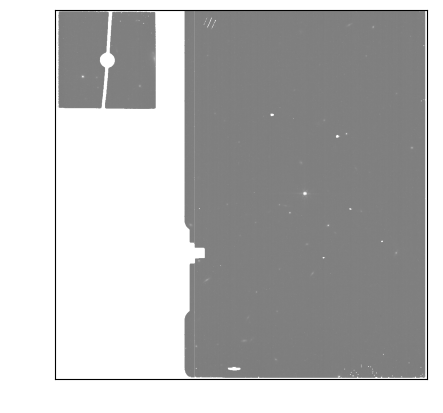

In [9]:
# Examine the First Image (Before DQ Flags Set)
ref_image = lvl2[0]
print(ref_image)
ref_fits = fits.open(ref_image)
ref_data = fits.open(ref_image)['SCI', 1].data
norm1 = simple_norm(ref_data, stretch='linear', min_cut=-1, max_cut=10)

plt.imshow(ref_data, origin='lower', norm=norm1, cmap='gray')
plt.gca().tick_params(labelcolor='none', axis='both', color='none')
plt.show()

In [10]:
# Change all DQ flagged pixels to NANs

# Reference for JWST DQ Flag Definitions: https://jwst-pipeline.readthedocs.io/en/latest/jwst/references_general/references_general.html
# In this case, we choose all DQ > 10, but users are encouraged to choose their own values accordingly.
for file in lvl2:
    ref_fits = ImageModel(file)
    data = ref_fits.data
    dq = ref_fits.dq
    data[dq >= 10] = np.nan
    ref_fits.data = data
    ref_fits.save(file)

In [11]:
# Change all DQ flagged pixels to NANs

# Reference for JWST DQ Flag Definitions: https://jwst-pipeline.readthedocs.io/en/latest/jwst/references_general/references_general.html
# In this case, we choose all DQ > 10, but users are encouraged to choose their own values accordingly.
for file in lvl2:
    hdul = fits.open(file, mode='update')
    data = fits.open(file)['SCI', 1].data
    dq = fits.open(file)['DQ', 1].data
    data[dq >= 10] = np.nan
    hdul['SCI', 1].data = data
    hdul.flush()

./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits


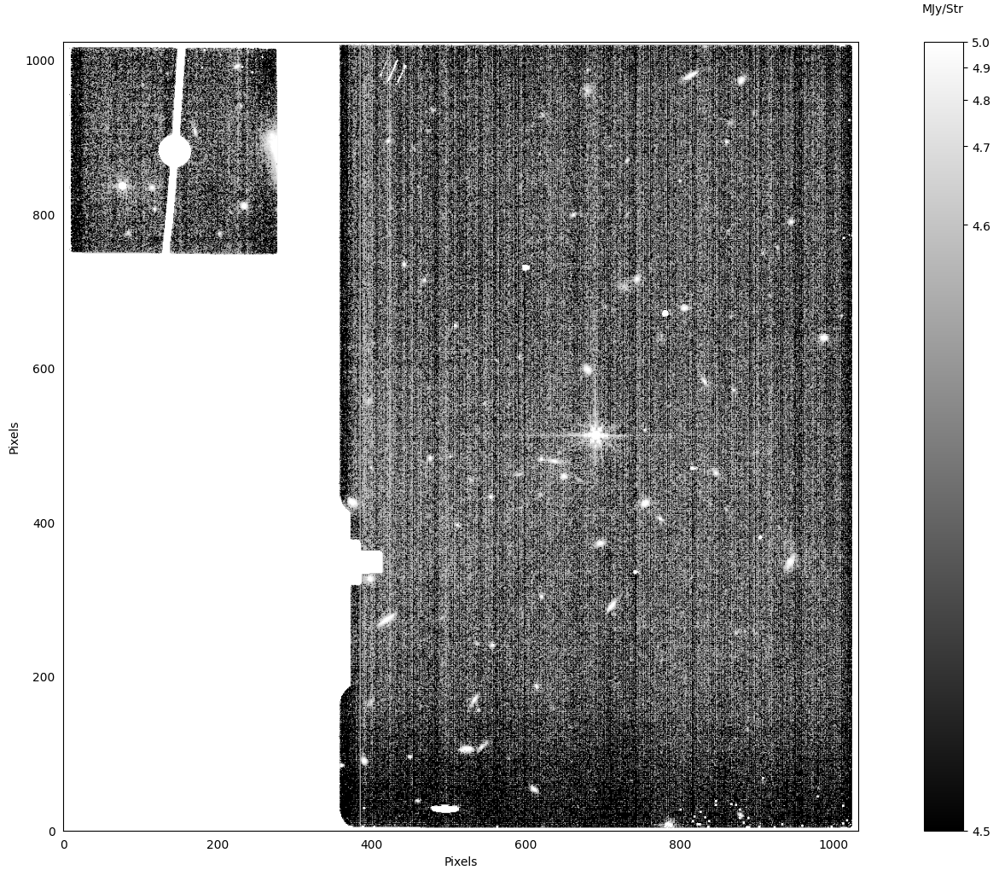

In [12]:
# Examine the First Image (After DQ Flags Set)
ref_image = lvl2[0]
print(ref_image)
ref_fits = ImageModel(ref_image)
ref_data = ref_fits.data

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_data, stretch='log', min_cut=4.5, max_cut=5)

plt.figure(figsize=(20, 12))
plt.imshow(ref_data, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.gca().tick_params(axis='both', color='none')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.show()

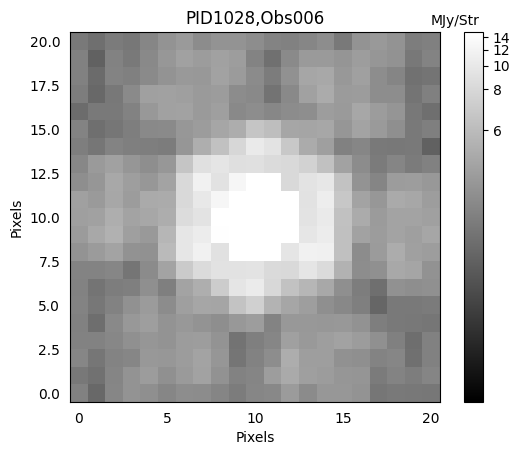

In [13]:
# Zoom in to see the source. In this case, our source is from MIRI Program ID #1028, a Calibration Program.
# We are using Visit 006, which targets the A5V dwarf 2MASSJ17430448+6655015
# Reference Link: http://simbad.cds.unistra.fr/simbad/sim-basic?Ident=2MASSJ17430448%2B6655015&submit=SIMBAD+search

source_location = SkyCoord('17:43:04.4879', '+66:55:01.837', unit=(u.hourangle, u.deg))

ref_wcs = ref_fits.get_fits_wcs()
#ref_wcs = WCS(ref_fits[0].header)

ref_y, ref_x = skycoord_to_pixel(source_location, ref_wcs)
ref_cutout = extract_array(ref_data, (21, 21), (ref_x, ref_y))

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_cutout, stretch='log', min_cut=4.3, max_cut=15)
plt.imshow(ref_cutout, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('PID1028,Obs006')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both', color='none')
plt.show()

./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits


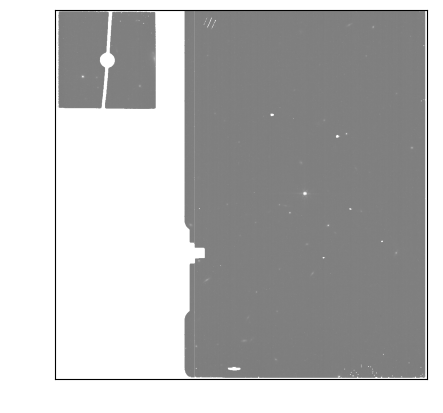

In [14]:
# Examine the First Image (After DQ Flags Set)
ref_image = lvl2[0]
print(ref_image)
ref_fits = fits.open(ref_image)
ref_data = fits.open(ref_image)['SCI', 1].data
norm1 = simple_norm(ref_data, stretch='linear', min_cut=-1, max_cut=10)

plt.imshow(ref_data, origin='lower', norm=norm1, cmap='gray')
plt.gca().tick_params(labelcolor='none', axis='both', color='none')
plt.show()

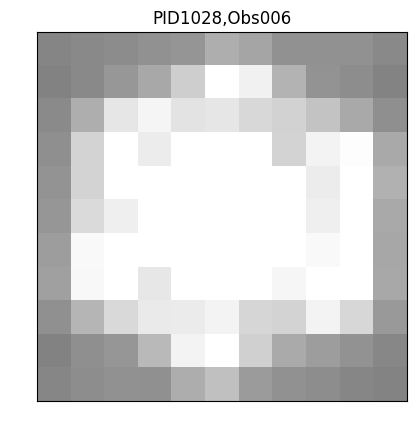

In [15]:
# Zoom in to see the source
source_location = SkyCoord('17:43:04.4879', '+66:55:01.837', unit=(u.hourangle, u.deg))
ref_y, ref_x = skycoord_to_pixel(source_location, wcs.WCS(ref_fits['SCI', 1], ref_fits))
ref_cutout = extract_array(ref_data, (11, 11), (ref_x, ref_y))
norm1 = simple_norm(ref_cutout, stretch='linear', min_cut=-1, max_cut=10)
plt.imshow(ref_cutout, origin='lower',
           norm=norm1, cmap='gray')
plt.title('PID1028,Obs006')
plt.gca().tick_params(labelcolor='none', axis='both', color='none')
plt.show()

In [16]:
# Get the PSF from WebbPSF using defaults.
jwst_obs = space_phot.observation2(lvl2)
psfs = space_phot.get_jwst_psf(jwst_obs, source_location)

Setting up sim to match ./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits


iterating query, tdelta=3.0

MAST OPD query around UTC: 2022-05-25T01:14:08.073
                        MJD: 59724.05148232639

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/O2022052501-NRCA3_FP1-59.fits
	Date (MJD):	 59723.8076
	Delta time:	 -0.2439 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022052701-NRCA3_FP1-0.fits
	Date (MJD):	 59726.0139
	Delta time:	 1.9624 days
User requested choosing OPD time closest in time to 2022-05-25T01:14:08.073, which is O2022052501-NRCA3_FP1-59.fits, delta time -0.244 days


 [Done]


Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/O2022052501-NRCA3_FP1-59.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F770W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(512.58446788), array(691.01192923)) pixels


    Position 1/1 centroid: (121.51240355224516, 121.46005973914637)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(512.0823346), array(703.49975178)) pixels


    Position 1/1 centroid: (121.51086191643049, 121.4622239877099)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(507.07857065), array(701.00356235)) pixels


    Position 1/1 centroid: (121.51028045414718, 121.46207330662133)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(502.58093657), array(694.50845109)) pixels


    Position 1/1 centroid: (121.51039393601155, 121.46118840344465)


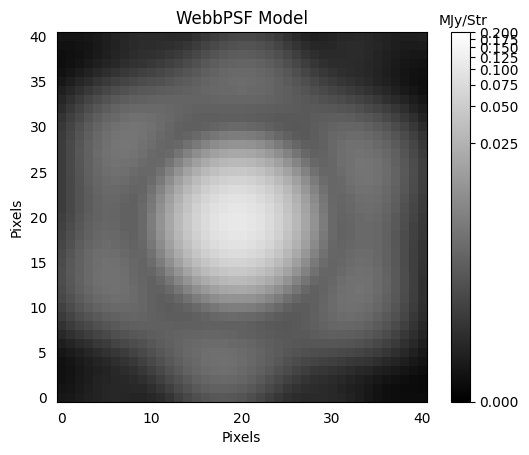

In [17]:
# The scale should highlight the background noise so it is possible to see all faint sources.
ref_cutout = extract_array(psfs[0].data, (41, 41), (122, 122))
norm1 = simple_norm(ref_cutout, stretch='log', min_cut=0.0, max_cut=0.2)
plt.imshow(ref_cutout, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('WebbPSF Model')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both', color='none')
plt.show()

#### Notes on the PSF Fitting in Space_Phot: <br> 

https://st-phot.readthedocs.io/en/latest/examples/plot_a_psf.html#jwst-images
As noted above, improved documentation will be coming. For now, here are some important points to consider.

All fitting is performed with Astropy's Photutils. As with any photometry program, the printed statistical errors are good indicators of your success.

There are different fitting techniques, but when the fit_flux parameter is set to 'single', the source is fit simultaneously in all Level2 images. There is good reason for this outlined in a paper for PSF fitting in Hubble: https://iopscience.iop.org/article/10.1086/316630/pdf

As a result, the flux and corresponding error take into account a single overall fit. As part of this, the fitting therefore assumes a constant zero point across all images. While this is not exactly true, it is typically true to within 1\% and good enough for our purposes. Users can alternatively fit with the fit_flux parameter set to 'multi', which treats each image independently. The final flux must therefore be averaged.

When you run space_phot, you will see some additional diagnositics displayed in the cell. At the top, the % value printed is the fraction of flux remaining in the residual and can be considered a good indicator of a successful model and subtraction. Next are three columns displaying the original, the model, and the residual, respectively, for each Level2 image. Finally, there are corner plots suggesting the success of the fits (more documentation and explanation of these plots is coming).

In this case, you will notice a systematic trend in the residuals. The PSF is oversubtracted in the centermost pixel and undersubtracted in the wings. The cause is unknown. It may be due to a poor PSF model. The user should consider generating more complex PSF models, but that is beyond the scope of this notebook. Nonetheless, the residual value is pretty good so the overall statistical error is relatively small.

Finished PSF psf_photometry with median residuals of 2.31%


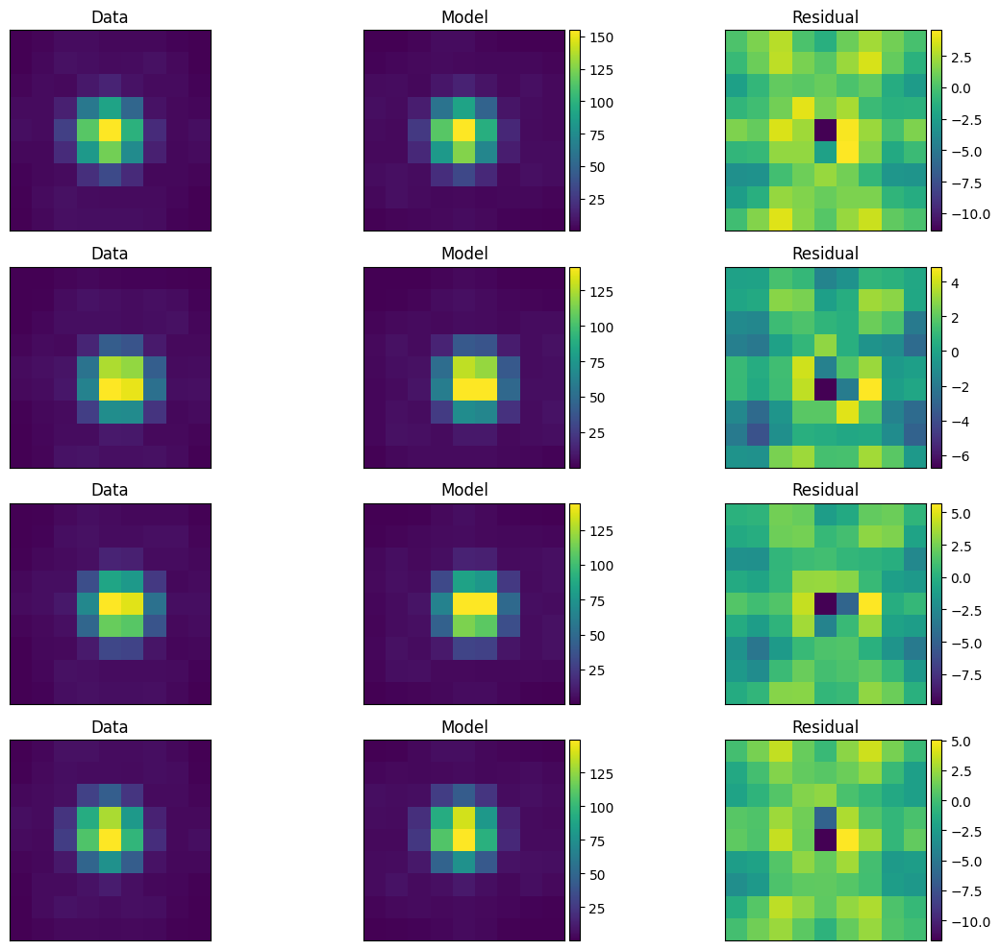

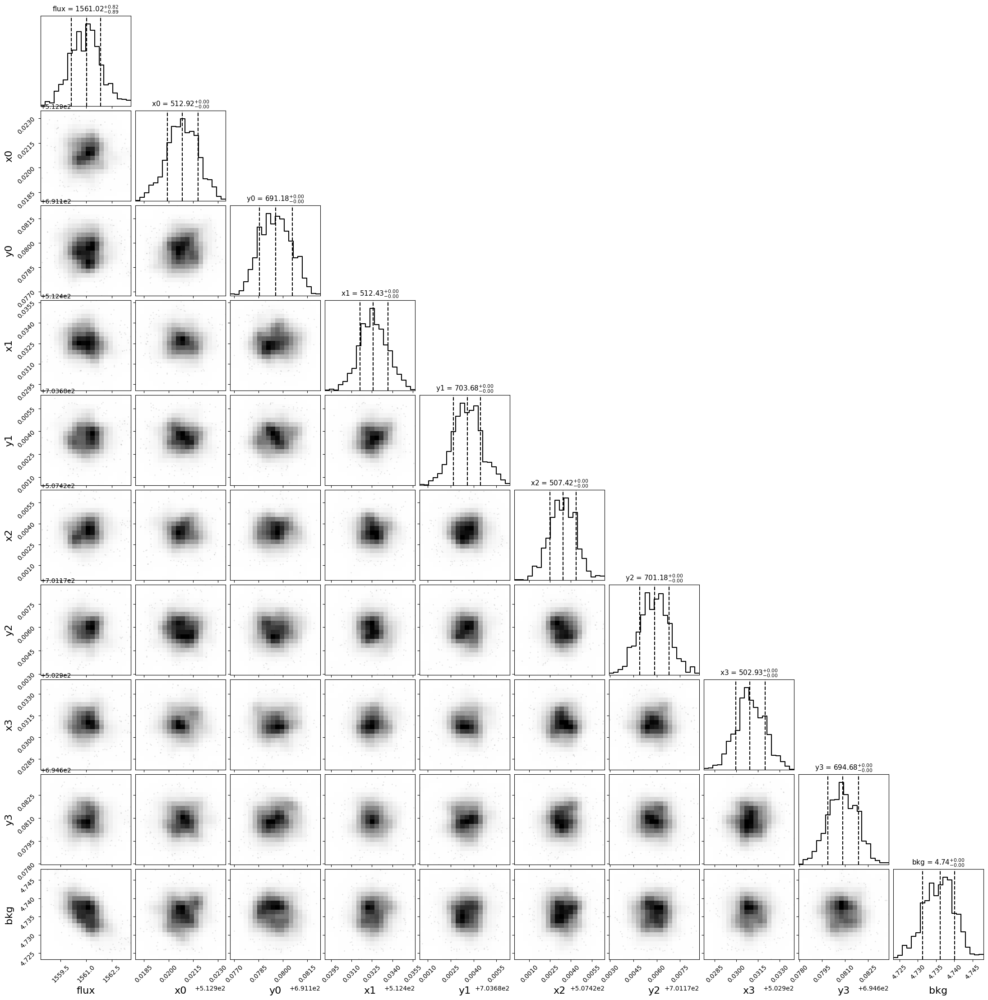

        ra         ...                     exp                    
------------------ ... -------------------------------------------
  265.768699137531 ... jw01028006001_02101_00001_mirimage_cal.fits
265.76869976591996 ... jw01028006001_02101_00002_mirimage_cal.fits
 265.7686991563031 ... jw01028006001_02101_00003_mirimage_cal.fits
  265.768698979314 ... jw01028006001_02101_00004_mirimage_cal.fits


In [18]:
# Do PSF Photometry using space_phot (details of fitting are in documentation)
jwst_obs.psf_photometry(
    psfs,
    source_location,
    bounds={
        'flux': [-10000, 10000],
        'centroid': [-2, 2],
        'bkg': [0, 50]
    },
    fit_width=9,
    fit_bkg=True,
    fit_flux='single'
)

jwst_obs.plot_psf_fit()
plt.show()

jwst_obs.plot_psf_posterior(minweight=.0005)
plt.show()

print(jwst_obs.psf_result.phot_cal_table)

In [19]:
jwst_obs.psf_result.phot_cal_table

ra,ra_err,dec,dec_err,x,x_err,y,y_err,mjd,flux,fluxerr,filter,zp,mag,magerr,zpsys,exp
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str5,float64,float64,float64,str2,str43
265.768699137531,3.304648998891935e-08,66.91716537780025,4.0334171558242815e-08,512.9208330613394,0.0009751101566321761,691.1795322514705,0.0009773286589659317,59724.05148232454,4.479753458866522e-10,2.68227562688183e-13,F770W,-6.100000000000005,17.271864716343973,0.0006498956412025414,ab,jw01028006001_02101_00001_mirimage_cal.fits
265.76869976591996,3.011092530869064e-08,66.91716477233997,4.255322494373104e-08,512.4326275446663,0.0010561509602273146,703.6835917805605,0.0009773048639063289,59724.05578601667,4.479753452721602e-10,2.6822756232025277e-13,F770W,-6.100000000000005,17.27186471783329,0.0006498956412025414,ab,jw01028006001_02101_00002_mirimage_cal.fits
265.7686991563031,3.227370370950666e-08,66.91716508118752,4.1049332821785356e-08,507.4234209638825,0.0010003174234407824,701.1758392388076,0.000979278411089562,59724.06012231296,4.479753453526981e-10,2.682275623684752e-13,F770W,-6.100000000000001,17.271864717638092,0.0006498956412025414,ab,jw01028006001_02101_00003_mirimage_cal.fits
265.768698979314,3.2161949548026314e-08,66.91716493592946,4.2155406276833673e-08,502.93096606205745,0.0010327549685662744,694.6808379210811,0.0009943475791366594,59724.064394164816,4.479753456231649e-10,2.6822756253041864e-13,F770W,-6.100000000000005,17.271864716982574,0.0006498956412025414,ab,jw01028006001_02101_00004_mirimage_cal.fits


In [20]:
# Print Magnitude from Table
# As noted above, As a result, the flux and corresponding error take into account a single overall fit. 
# Therefore, there is no need to average the resulting magnitudes or errors. They should all be the same to within their individual zero-point differences (typically <1%).
mag_lvl2_arr = jwst_obs.psf_result.phot_cal_table['mag']
magerr_lvl2_arr = jwst_obs.psf_result.phot_cal_table['magerr']

print(mag_lvl2_arr, '\n', magerr_lvl2_arr)

       mag        
------------------
17.271864716343973
 17.27186471783329
17.271864717638092
17.271864716982574 
         magerr       
---------------------
0.0006498956412025414
0.0006498956412025414
0.0006498956412025414
0.0006498956412025414


In [21]:
jwst_obs_fast = space_phot.observation2(lvl2[0])

In [22]:
ref_x

array(512.58446788)

In [23]:
centers = [ref_x, ref_y]
jwst_obs_fast.fast_psf(psfs[0], centers)

id,group_id,local_bkg,x_init,y_init,flux_init,x_fit,y_fit,flux_fit,x_err,y_err,flux_err,npixfit,group_size,qfit,cfit,flags,flux,fluxerr,mag,magerr,zp
int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,float64,float64,int64,float64,float64,float64,float64,float64
1,1,0.0,691.0119292269617,512.5844678797273,1668.2629074618387,691.1736423963373,512.9081319598845,1861.7546481804886,0.0008250237966256781,0.0008332862486822053,1.7352060017478144,25,1,0.4383646707471222,-0.02855987894870955,0,5.342907155405971e-10,4.979734881769984e-13,17.080555931398994,0.0010114644093129814,-6.100000000000001


### 3.2<font color='white'>-</font>Single, Level3 Mosaicked File<a class="anchor" id="bso3"></a> ###

Despite the above discussion on performing PSF photometry on the pre-mosaiced data products, space_phot has the functionality to create a mosaiced Level3 PSF at a given single position on the detector based on the Level2 images. The advantage to this is the ability to perform PSF photometry on the deep, stacked data in cases where faint sources are expected to have prohibitively low signal-to-noise in Level2 data. The disadvantage is the amount of time required to make mosaiced Level3 PSF, so that this method is most useful when dealing with a small number of low signal-to-noise sources.<br>

Useful references:<br>
Space-Phot Documentation on Level3 Fitting: https://space-phot.readthedocs.io/en/latest/examples/plot_a_psf.html#level-3-psf<br>

In [24]:
# Level3 data file the same as above.
lvl3

['./mast/01028/jw01028-o006_t001_miri_f770w_i2d.fits']

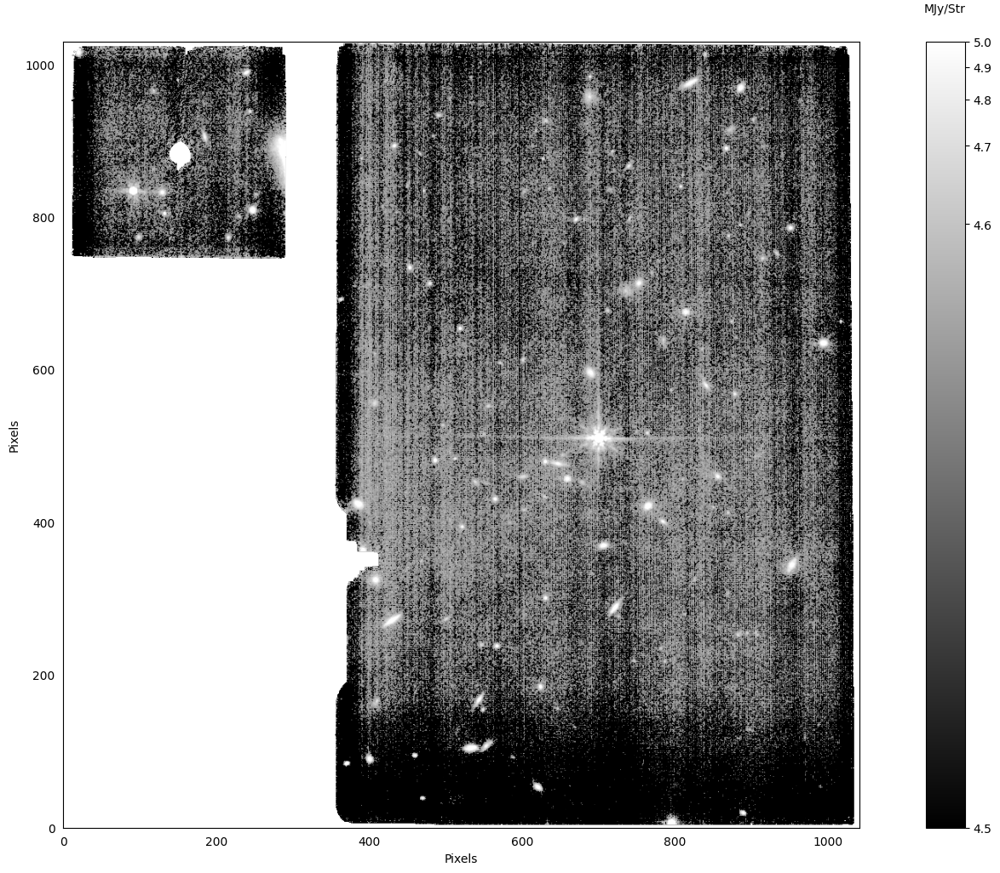

In [25]:
# Now do the same photometry on the Level 3 Data
ref_image = lvl3[0]
ref_fits = ImageModel(ref_image)
ref_data = ref_fits.data

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_data, stretch='log', min_cut=4.5, max_cut=5)

plt.figure(figsize=(20, 12))
plt.imshow(ref_data, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.gca().tick_params(axis='both', color='none')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.show()

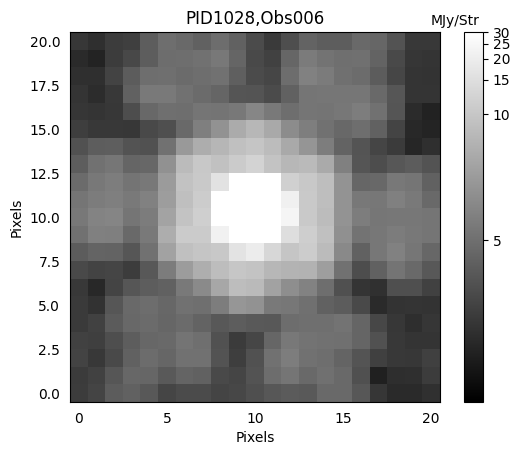

In [26]:
source_location = SkyCoord('17:43:04.4879', '+66:55:01.837', unit=(u.hourangle, u.deg))

ref_wcs = ref_fits.get_fits_wcs()
ref_y, ref_x = skycoord_to_pixel(source_location, ref_wcs)
ref_cutout = extract_array(ref_data, (21, 21), (ref_x, ref_y))

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_cutout, stretch='log', min_cut=4.5, max_cut=30)
plt.imshow(ref_cutout, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('PID1028,Obs006')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both', color='none')
plt.show()

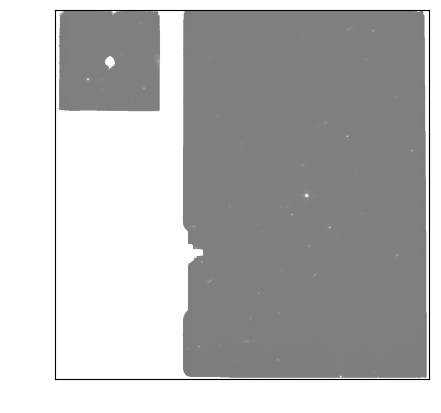

In [27]:
# Now do the same photometry on the Level 3 Data
ref_image = lvl3[0]
ref_fits = fits.open(ref_image)
ref_data = fits.open(ref_image)['SCI', 1].data
norm1 = simple_norm(ref_data, stretch='linear', min_cut=-1, max_cut=10)

plt.imshow(ref_data, origin='lower',
           norm=norm1, cmap='gray')
plt.gca().tick_params(labelcolor='none', axis='both', color='none')
plt.show()

In [28]:
# Get PSF from WebbPSF

# The function get_jwst_psf is a space_phot wrapper for the WebbPSF calc_psf function and uses a lot of the same keywords.
# There are more advanced methods for generating your WebbPSF, but those are beyond the scope of this notebook.
# The defaults used by get_jwst_psf in this notebook are:
# oversample=4
# normalize='last'
# Non-distorted PSF
# Useful reference: https://webbpsf.readthedocs.io/en/latest/api/webbpsf.JWInstrument.html#webbpsf.JWInstrument.calc_psf

jwst3_obs = space_phot.observation3(lvl3[0])
psf3 = space_phot.get_jwst3_psf(jwst_obs, jwst3_obs, source_location) # ,num_psfs=4)

Setting up sim to match ./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits


iterating query, tdelta=3.0



MAST OPD query around UTC: 2022-05-25T01:14:08.073
                        MJD: 59724.05148232639

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/O2022052501-NRCA3_FP1-59.fits
	Date (MJD):	 59723.8076
	Delta time:	 -0.2439 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022052701-NRCA3_FP1-0.fits
	Date (MJD):	 59726.0139
	Delta time:	 1.9624 days
User requested choosing OPD time closest in time to 2022-05-25T01:14:08.073, which is O2022052501-NRCA3_FP1-59.fits, delta time -0.244 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/O2022052501-NRCA3_FP1-59.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F770W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(512.58446788), array(691.01192923)) pixels


    Position 1/1 centroid: (201.5124035522455, 201.4600597391466)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(512.0823346), array(703.49975178)) pixels


    Position 1/1 centroid: (201.51086191643108, 201.4622239877097)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(507.07857065), array(701.00356235)) pixels


    Position 1/1 centroid: (201.51028045414768, 201.46207330662145)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(502.58093657), array(694.50845109)) pixels


    Position 1/1 centroid: (201.5103939360115, 201.46118840344508)


2025-01-10 19:33:07,937 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2025-01-10 19:33:07,938 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2025-01-10 19:33:07,941 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2025-01-10 19:33:07,942 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2025-01-10 19:33:07,944 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2025-01-10 19:33:07,945 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2025-01-10 19:33:07,946 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2025-01-10 19:33:08,110 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('./temp_psf_dir/cal_data_asn.json',).


2025-01-10 19:33:08,124 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: ./temp_psf_dir
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: False


2025-01-10 19:33:08,125 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2025-01-10 19:33:08,566 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd361093d0>,).


2025-01-10 19:33:08,567 - stpipe.Image3Pipeline.tweakreg - INFO - Step skipped.


2025-01-10 19:33:09,402 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd361093d0>,).


2025-01-10 19:33:09,402 - stpipe.Image3Pipeline.skymatch - INFO - Step skipped.


2025-01-10 19:33:09,565 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd361093d0>,).


2025-01-10 19:33:09,566 - stpipe.Image3Pipeline.outlier_detection - INFO - Step skipped.


2025-01-10 19:33:09,731 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd361093d0>,).


2025-01-10 19:33:09,733 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:33:09,733 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:33:09,734 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:33:09,734 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:33:09,737 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:33:09,737 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:33:09,737 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:33:09,738 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:33:09,739 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:33:09,740 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:33:09,741 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:33:09,741 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:33:09,742 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:33:09,743 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:33:09,743 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:33:09,744 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:33:09,746 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2025-01-10 19:33:09,746 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2025-01-10 19:33:09,746 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2025-01-10 19:33:09,747 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2025-01-10 19:33:09,747 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale: 0.11091579557784445 arcsec.


2025-01-10 19:33:09,768 - stpipe.Image3Pipeline.resample - INFO - Resampling science and variance data


2025-01-10 19:33:10,570 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01028006001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:33:10,571 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01028006001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:33:10,572 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01028006001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:33:11,325 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01028006001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:33:11,327 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01028006001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:33:11,327 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01028006001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:33:12,084 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01028006001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:33:12,085 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01028006001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:33:12,086 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01028006001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:33:12,840 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01028006001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:33:12,841 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01028006001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:33:12,841 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01028006001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:33:13,100 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  265.737953477 66.940980694 265.701111178 66.912738191 265.773940695 66.898122976 265.810845165 66.926348568


2025-01-10 19:33:13,403 - stpipe.Image3Pipeline.resample - INFO - Saved model in ./temp_psf_dir/temp_psf_cals_i2d.fits


2025-01-10 19:33:13,403 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2025-01-10 19:33:13,573 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(1030, 1042) from temp_psf_cals_i2d.fits>,).


2025-01-10 19:33:13,574 - stpipe.Image3Pipeline.source_catalog - INFO - Step skipped.


2025-01-10 19:33:13,580 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2025-01-10 19:33:13,580 - stpipe - INFO - Results used jwst version: 1.17.1


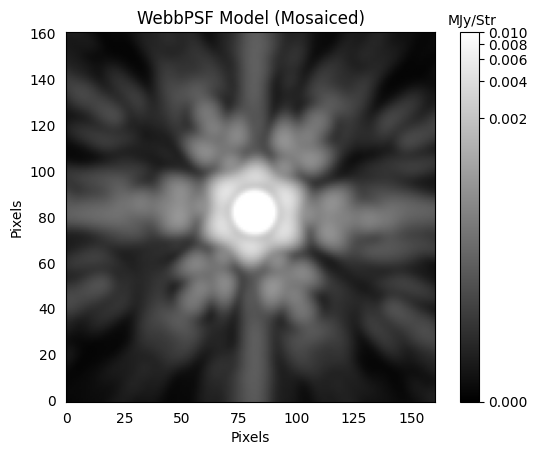

In [29]:
# The scale should highlight the background noise so it is possible to see all faint sources.
ref_cutout = extract_array(psf3.data, (161, 161), (200, 200))
norm1 = simple_norm(ref_cutout, stretch='log', min_cut=0.0, max_cut=0.01)
plt.imshow(ref_cutout, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('WebbPSF Model (Mosaiced)')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both', color='none')
plt.show()

#### Notes on the PSF Fitting in Space_Phot: <br> 

https://st-phot.readthedocs.io/en/latest/examples/plot_a_psf.html#jwst-images
As noted above, improved documentation will be coming. For now, here are some important points to consider.
See detailed notes in Section 3.1 above about the fitting process and diagnostics

In addition, consider here that jwst3_obs is generating a Level3 PSF by using the JWST pipeline to resample and combine multiple Level2 PSFs. The Level2 PSFs are generated at the precise location of the source in each Level2 file to account for detector level effects. The resampling uses default resampling paramters. However, users should be aware that if they performed customized resampling for their Level2 data products, they should use similar resampling steps for their PSF below.

Finished PSF psf_photometry with median residuals of 0.60%


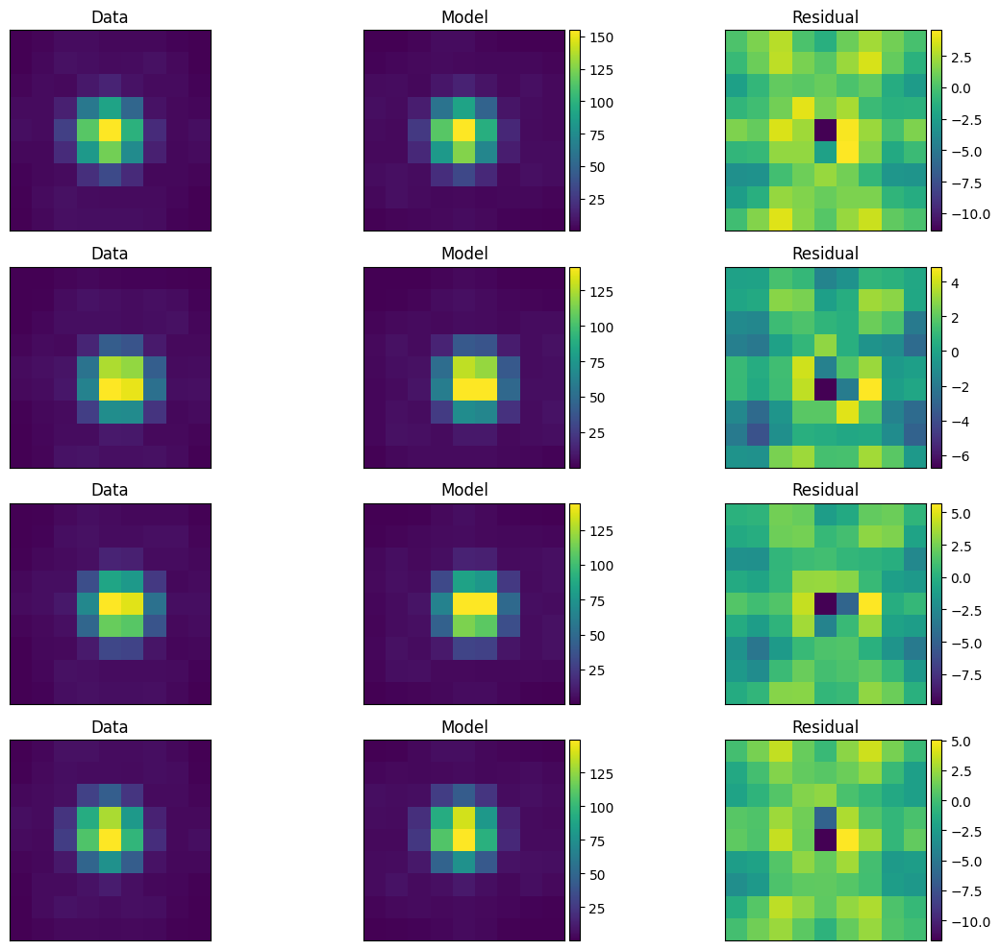

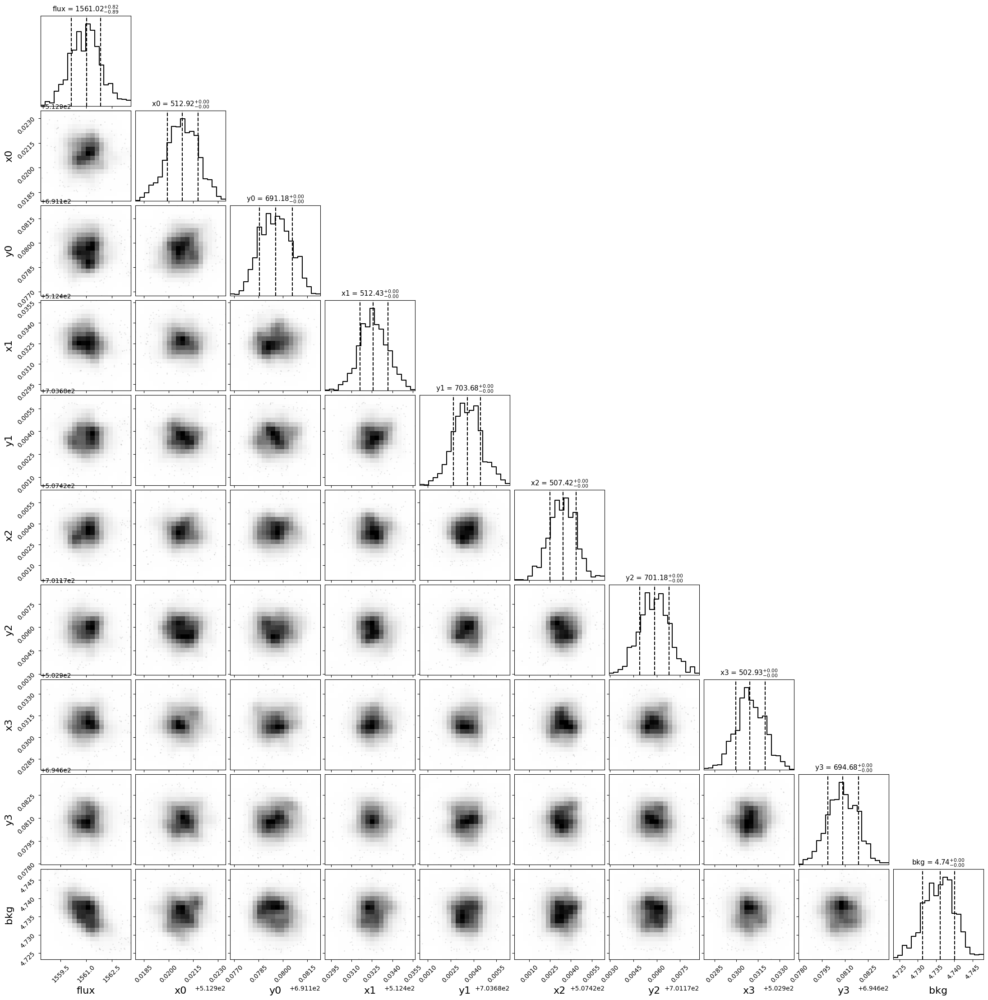

In [30]:
# Do PSF Photometry using space_phot (details of fitting are in documentation)
# See detailed notes in Section 3.1 above about the fitting process and diagnostics
jwst3_obs.psf_photometry(
    psf3,
    source_location,
    bounds={
        'flux': [-10000, 10000],
        'centroid': [-2, 2],
        'bkg': [0, 50]
    },
    fit_width=9,
    fit_bkg=True,
    fit_flux=True
)

jwst_obs.plot_psf_fit()
plt.show()

jwst_obs.plot_psf_posterior(minweight=.0005)
plt.show()

In [31]:
mag_lvl3psf = jwst3_obs.psf_result.phot_cal_table['mag'][0]
magerr_lvl3psf = jwst3_obs.psf_result.phot_cal_table['magerr'][0]

print(round(mag_lvl2_arr[0], 4), round(magerr_lvl2_arr[0], 4))
print(round(mag_lvl3psf, 5), round(magerr_lvl3psf, 5))

17.2719 0.0006
17.28634 0.00074


## Good agreement between Level2 and level3 results!

4.<font color='white'>-</font>Faint/Upper Limit, Single Object<a class="anchor" id="fso"></a>
------------------

The purpose of this section is to illustrate how to calculate an upper limit using PSF photometry a blank part of the sky. 

### 4.1<font color='white'>-</font>Multiple, Level2 Files<a class="anchor" id="fso2"></a> ###

In [32]:
# Level 3 Files
lvl3 = ['mast/01028/jw01028-o006_t001_miri_f770w_i2d.fits']
lvl3

['mast/01028/jw01028-o006_t001_miri_f770w_i2d.fits']

In [33]:
# Create Level 2 Data List from ASN files
prefix = "./mast/01028/"
asn = glob.glob(prefix+'jw01028-o006_*_image3_00004_asn.json')

with open(asn[0], "r") as fi:
    lvl2 = []
    for ln in fi:
        #print(ln)
        if ln.startswith('                    "expname":'):
            x = ln[2:].split(':')
            y = x[1].split('"')
            lvl2.append(prefix+y[1])
            
print(lvl2)

['./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits', './mast/01028/jw01028006001_02101_00002_mirimage_cal.fits', './mast/01028/jw01028006001_02101_00003_mirimage_cal.fits', './mast/01028/jw01028006001_02101_00004_mirimage_cal.fits']


In [34]:
# Change all DQ flagged pixels to NANs

# Reference for JWST DQ Flag Definitions: https://jwst-pipeline.readthedocs.io/en/latest/jwst/references_general/references_general.html
# In this case, we choose all DQ > 10, but users are encouraged to choose their own values accordingly.
for file in lvl2:
    ref_fits = ImageModel(file)
    data = ref_fits.data
    dq = ref_fits.dq
    data[dq >= 10] = np.nan
    ref_fits.data = data
    ref_fits.save(file)

./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits


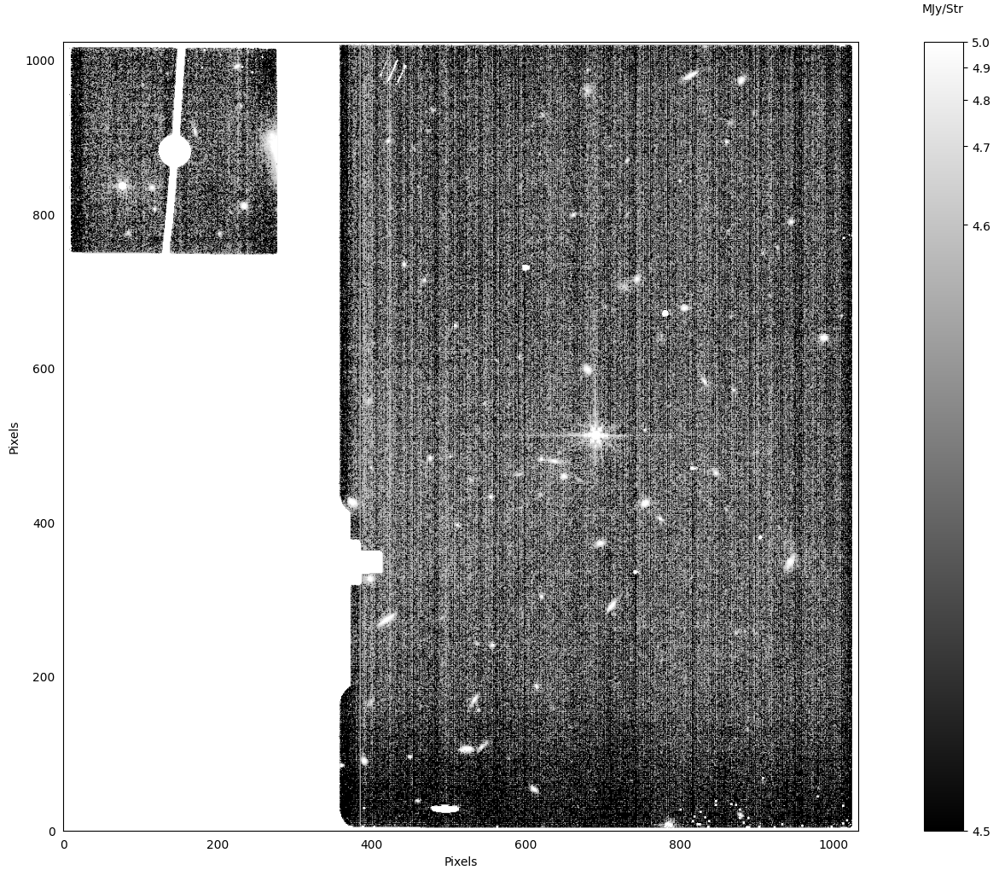

In [35]:
# Examine the First Image (After DQ Flags Set)
ref_image = lvl2[0]
print(ref_image)
ref_fits = ImageModel(ref_image)
ref_data = ref_fits.data

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_data, stretch='log', min_cut=4.5, max_cut=5)

plt.figure(figsize=(20, 12))
plt.imshow(ref_data, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.gca().tick_params(axis='both', color='none')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.show()

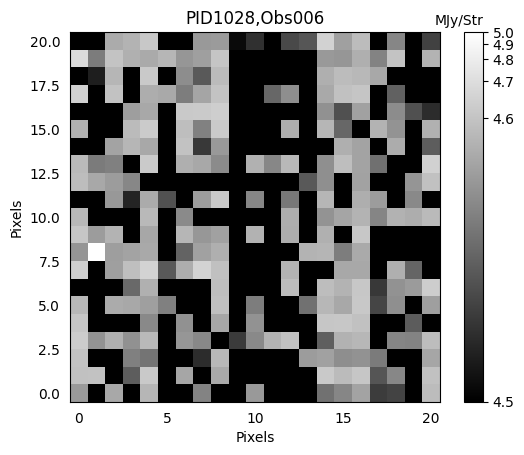

In [36]:
# Pick a blank part of the sky to calculate the upper limit
source_location = SkyCoord('17:43:00.0332', '+66:54:42.677', unit=(u.hourangle, u.deg))
ref_wcs = ref_fits.get_fits_wcs()
ref_y, ref_x = skycoord_to_pixel(source_location, ref_wcs)
ref_cutout = extract_array(ref_data, (21, 21), (ref_x, ref_y))

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_cutout, stretch='log', min_cut=4.5, max_cut=5)
plt.imshow(ref_cutout, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('PID1028,Obs006')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both', color='none')
plt.show()

./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits


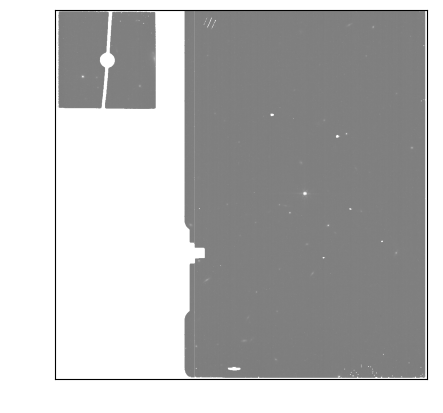

In [37]:
# Examine the First Image
ref_image = lvl2[0]
print(ref_image)
ref_fits = fits.open(ref_image)
ref_data = fits.open(ref_image)['SCI', 1].data
norm1 = simple_norm(ref_data, stretch='linear', min_cut=-1, max_cut=10)

plt.imshow(ref_data, origin='lower', norm=norm1, cmap='gray')
plt.gca().tick_params(labelcolor='none', axis='both', color='none')
plt.show()

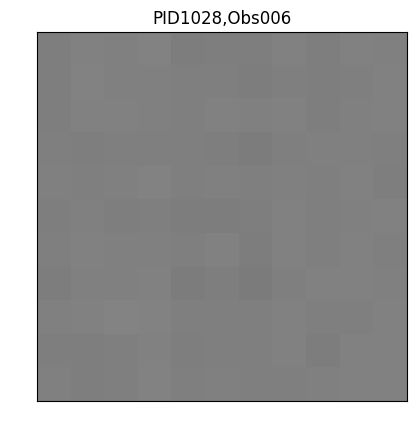

In [38]:
# Pick a blank part of the sky to calculate the upper limit
source_location = SkyCoord('17:43:00.0332', '+66:54:42.677', unit=(u.hourangle, u.deg))
ref_y, ref_x = skycoord_to_pixel(source_location, wcs.WCS(ref_fits['SCI', 1], ref_fits))
ref_cutout = extract_array(ref_data, (11, 11), (ref_x, ref_y))
norm1 = simple_norm(ref_cutout, stretch='linear', min_cut=-1, max_cut=10)
plt.imshow(ref_cutout, origin='lower',
           norm=norm1, cmap='gray')
plt.title('PID1028,Obs006')
plt.gca().tick_params(labelcolor='none', axis='both', color='none')
plt.show()

In [39]:
# Get PSF from WebbPSF
# The function get_jwst_psf is a space_phot wrapper for the WebbPSF calc_psf function and uses a lot of the same keywords.
# There are more advanced methods for generating your WebbPSF, but those are beyond the scope of this notebook.
# The defaults used by get_jwst_psf in this notebook are:
# oversample=4
# normalize='last'
# Non-distorted PSF
# Useful reference: https://webbpsf.readthedocs.io/en/latest/api/webbpsf.JWInstrument.html#webbpsf.JWInstrument.calc_psf

jwst_obs = space_phot.observation2(lvl2)
psfs = space_phot.get_jwst_psf(jwst_obs, source_location)

Setting up sim to match ./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits


iterating query, tdelta=3.0

MAST OPD query around UTC: 2022-05-25T01:14:08.073
                        MJD: 59724.05148232639

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/O2022052501-NRCA3_FP1-59.fits
	Date (MJD):	 59723.8076
	Delta time:	 -0.2439 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022052701-NRCA3_FP1-0.fits
	Date (MJD):	 59726.0139
	Delta time:	 1.9624 days
User requested choosing OPD time closest in time to 2022-05-25T01:14:08.073, which is O2022052501-NRCA3_FP1-59.fits, delta time -0.244 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/O2022052501-NRCA3_FP1-59.fits


Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F770W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(772.86069511), array(559.08387297)) pixels


    Position 1/1 centroid: (121.51420939304742, 121.52381573784315)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(772.32944238), array(571.63330681)) pixels


    Position 1/1 centroid: (121.5174643701714, 121.52330511426992)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(767.30763827), array(569.1357543)) pixels


    Position 1/1 centroid: (121.51685314039858, 121.52145590349731)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(762.80321923), array(562.61868067)) pixels


    Position 1/1 centroid: (121.51503596024747, 121.51983614651763)


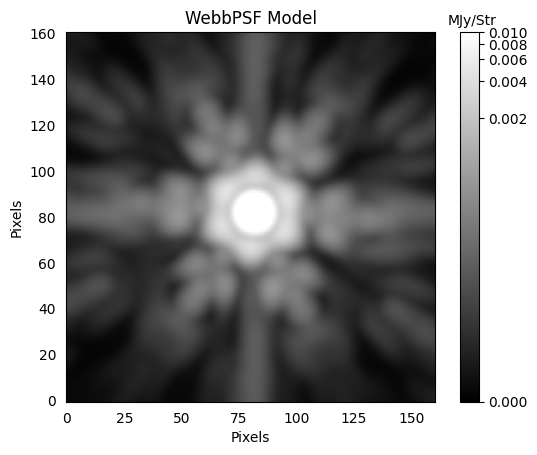

In [40]:
# The scale should highlight the background noise so it is possible to see all faint sources.
ref_cutout = extract_array(psf3.data, (161, 161), (200, 200))
norm1 = simple_norm(ref_cutout, stretch='log', min_cut=0.0, max_cut=0.01)
plt.imshow(ref_cutout, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('WebbPSF Model')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both', color='none')
plt.show()

Finished PSF psf_photometry with median residuals of 137.95%


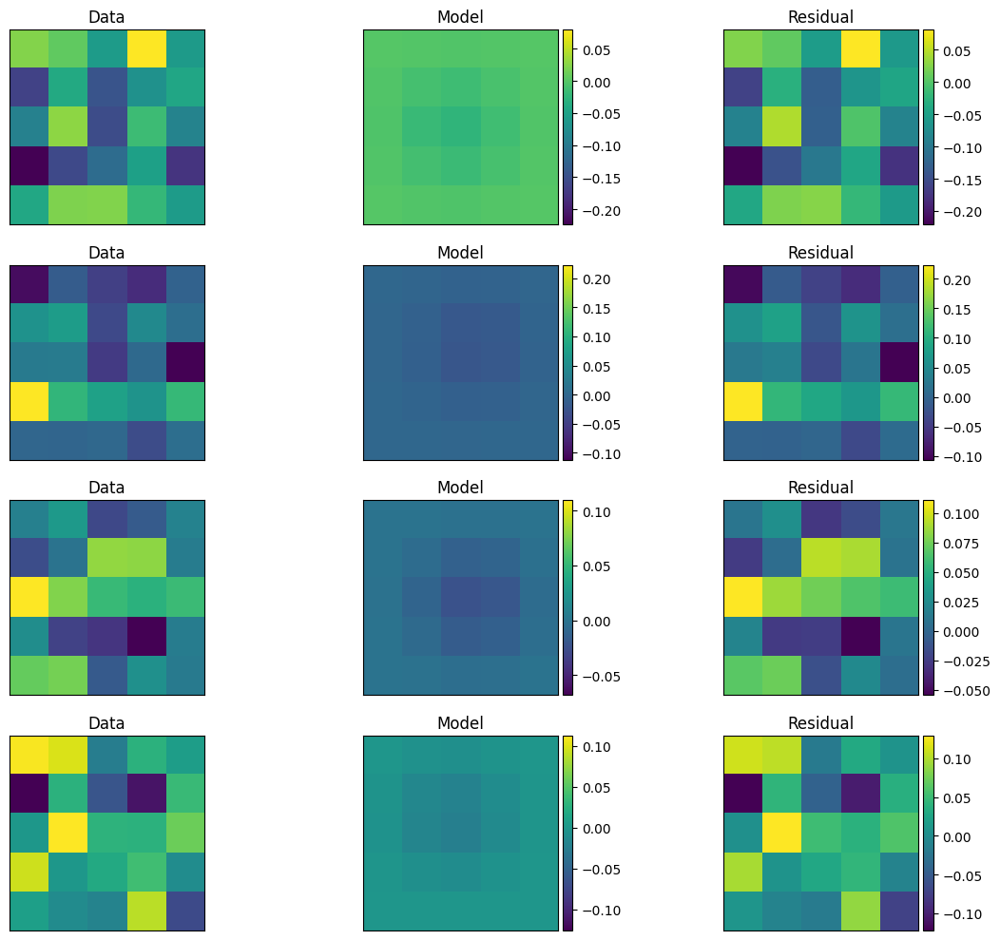

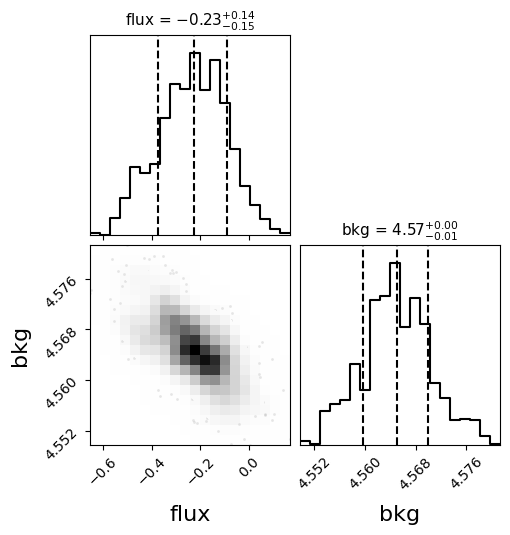

        ra         ...                     exp                    
------------------ ... -------------------------------------------
 265.7501383333533 ... jw01028006001_02101_00001_mirimage_cal.fits
 265.7501383333496 ... jw01028006001_02101_00002_mirimage_cal.fits
265.75013833334884 ... jw01028006001_02101_00003_mirimage_cal.fits
 265.7501383333493 ... jw01028006001_02101_00004_mirimage_cal.fits


In [41]:
# Do PSF Photometry using space_phot (details of fitting are in documentation)
# https://st-phot.readthedocs.io/en/latest/examples/plot_a_psf.html#jwst-images
jwst_obs.psf_photometry(
    psfs,
    source_location,
    bounds={
        'flux': [-10, 1000],
        'bkg': [0, 50]
    },
    fit_width=5,
    fit_bkg=True,
    fit_centroid='fixed',
    fit_flux='single'
)

jwst_obs.plot_psf_fit()
plt.show()

jwst_obs.plot_psf_posterior(minweight=.0005)
plt.show()

print(jwst_obs.psf_result.phot_cal_table)

In [42]:
# As noted above, As a result, the flux and corresponding error take into account a single overall fit. 
# Therefore, there is no need to average the resulting magnitudes or errors. They should all be the same to within their individual zero-point differences (typically <1%).
magupper_lvl2psf = jwst_obs.upper_limit(nsigma=5)
magupper_lvl2psf

array([25.63606332, 25.63606333, 25.63606333, 25.63606332])

### 4.2<font color='white'>-</font>Single, Level3 Mosaicked File<a class="anchor" id="fso3"></a> ###

In [43]:
# Level3 data file the same as above.
lvl3

['mast/01028/jw01028-o006_t001_miri_f770w_i2d.fits']

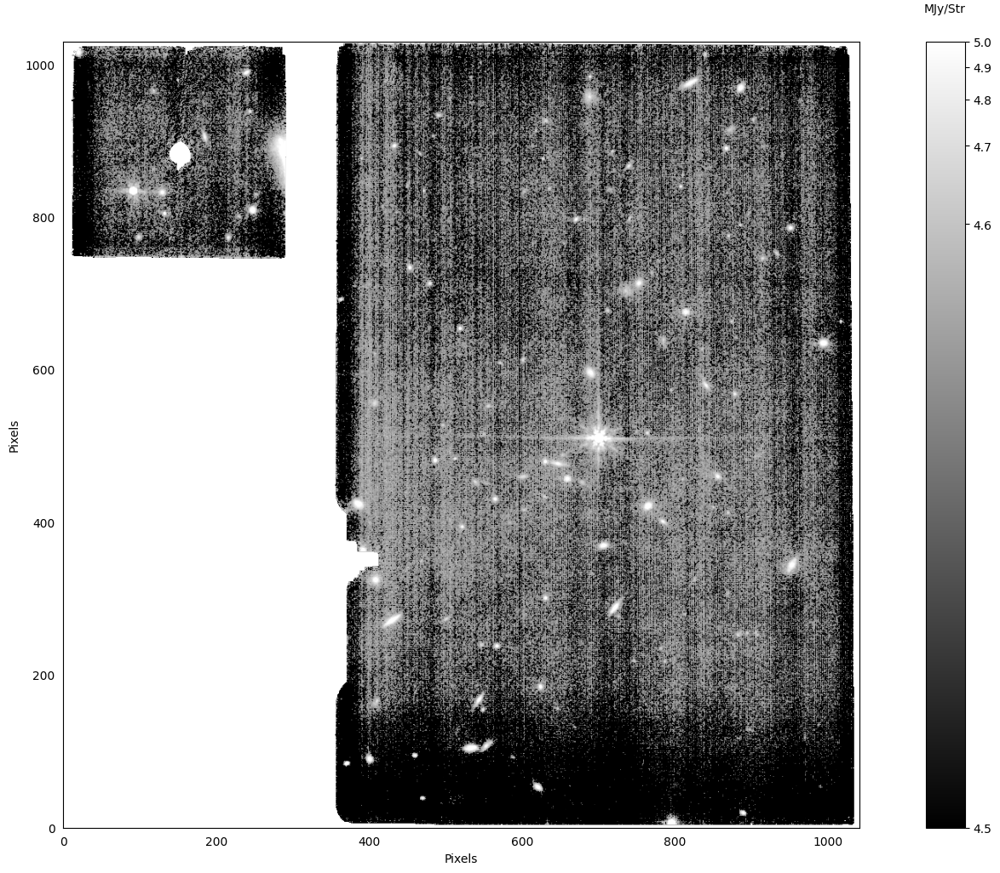

In [44]:
# Now do the same photometry on the Level 3 Data
ref_image = lvl3[0]
ref_fits = ImageModel(ref_image)
ref_data = ref_fits.data

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_data, stretch='log', min_cut=4.5, max_cut=5)

plt.figure(figsize=(20, 12))
plt.imshow(ref_data, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.gca().tick_params(axis='both', color='none')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.show()

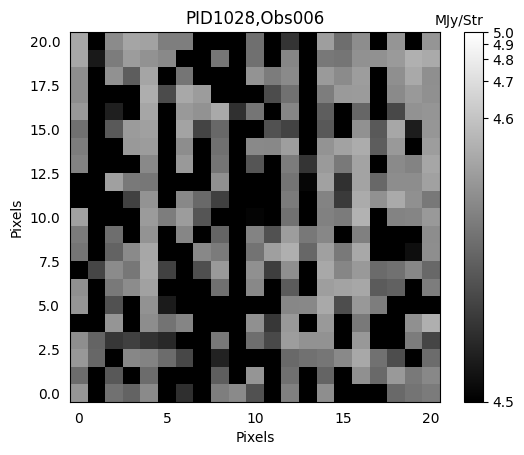

In [45]:
# Pick a blank part of the sky to calculate the upper limit
source_location = SkyCoord('17:43:00.0332', '+66:54:42.677', unit=(u.hourangle, u.deg))
ref_wcs = ref_fits.get_fits_wcs()
ref_y, ref_x = skycoord_to_pixel(source_location, ref_wcs)
ref_cutout = extract_array(ref_data, (21, 21), (ref_x, ref_y))

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_cutout, stretch='log', min_cut=4.5, max_cut=5)
plt.imshow(ref_cutout, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('PID1028,Obs006')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both', color='none')
plt.show()

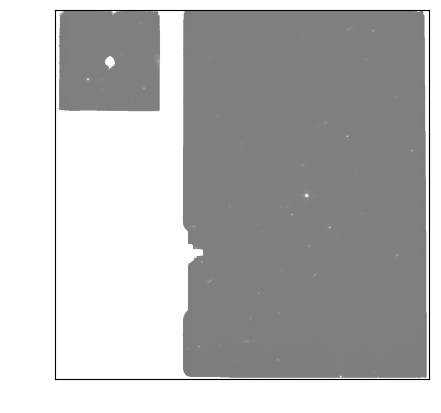

In [46]:
# Now do the same photometry on the Level 3 Data
ref_image = lvl3[0]
ref_fits = fits.open(ref_image)
ref_data = fits.open(ref_image)['SCI', 1].data
norm1 = simple_norm(ref_data, stretch='linear', min_cut=-1, max_cut=10)

plt.imshow(ref_data, origin='lower',
           norm=norm1, cmap='gray')
plt.gca().tick_params(labelcolor='none', axis='both', color='none')
plt.show()

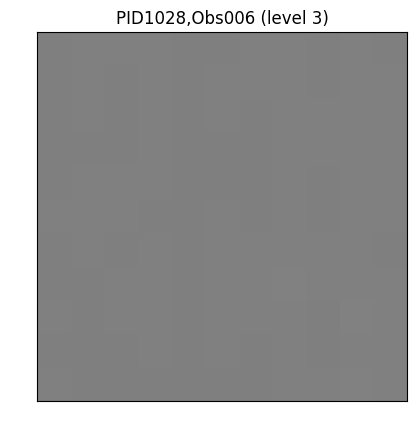

In [47]:
# Pick a blank part of the sky to calculate the upper limit
source_location = SkyCoord('17:43:00.0332', '+66:54:42.677', unit=(u.hourangle, u.deg))

ref_y, ref_x = skycoord_to_pixel(source_location, wcs.WCS(ref_fits['SCI', 1], ref_fits))
ref_cutout = extract_array(ref_data, (11, 11), (ref_x, ref_y))
norm1 = simple_norm(ref_cutout, stretch='linear', min_cut=-1, max_cut=10)
plt.imshow(ref_cutout, origin='lower',
           norm=norm1, cmap='gray')
plt.title('PID1028,Obs006 (level 3)')
plt.gca().tick_params(labelcolor='none', axis='both', color='none')
plt.show()

In [48]:
# Get PSF from WebbPSF
# The function get_jwst_psf is a space_phot wrapper for the WebbPSF calc_psf function and uses a lot of the same keywords.
# There are more advanced methods for generating your WebbPSF, but those are beyond the scope of this notebook.
# The defaults used by get_jwst_psf in this notebook are:
# oversample=4
# normalize='last'
# Non-distorted PSF
# Useful reference: https://webbpsf.readthedocs.io/en/latest/api/webbpsf.JWInstrument.html#webbpsf.JWInstrument.calc_psf

jwst3_obs = space_phot.observation3(lvl3[0])
psf3 = space_phot.get_jwst3_psf(jwst_obs, jwst3_obs, source_location)

Setting up sim to match ./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits


iterating query, tdelta=3.0

MAST OPD query around UTC: 2022-05-25T01:14:08.073
                        MJD: 59724.05148232639

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/O2022052501-NRCA3_FP1-59.fits
	Date (MJD):	 59723.8076
	Delta time:	 -0.2439 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022052701-NRCA3_FP1-0.fits
	Date (MJD):	 59726.0139
	Delta time:	 1.9624 days
User requested choosing OPD time closest in time to 2022-05-25T01:14:08.073, which is O2022052501-NRCA3_FP1-59.fits, delta time -0.244 days


Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/O2022052501-NRCA3_FP1-59.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F770W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(772.86069511), array(559.08387297)) pixels


    Position 1/1 centroid: (201.51420939304728, 201.52381573784302)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(772.32944238), array(571.63330681)) pixels


    Position 1/1 centroid: (201.5174643701711, 201.52330511426985)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(767.30763827), array(569.1357543)) pixels


    Position 1/1 centroid: (201.51685314039872, 201.5214559034972)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(762.80321923), array(562.61868067)) pixels


    Position 1/1 centroid: (201.51503596024762, 201.51983614651743)


2025-01-10 19:34:05,072 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2025-01-10 19:34:05,073 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2025-01-10 19:34:05,075 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2025-01-10 19:34:05,077 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2025-01-10 19:34:05,079 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2025-01-10 19:34:05,080 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2025-01-10 19:34:05,082 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2025-01-10 19:34:05,269 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('./temp_psf_dir/cal_data_asn.json',).


2025-01-10 19:34:05,283 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: ./temp_psf_dir
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: False


2025-01-10 19:34:05,284 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2025-01-10 19:34:05,730 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd2c053dd0>,).


2025-01-10 19:34:05,731 - stpipe.Image3Pipeline.tweakreg - INFO - Step skipped.


2025-01-10 19:34:06,588 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd2c053dd0>,).


2025-01-10 19:34:06,589 - stpipe.Image3Pipeline.skymatch - INFO - Step skipped.


2025-01-10 19:34:06,773 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd2c053dd0>,).


2025-01-10 19:34:06,774 - stpipe.Image3Pipeline.outlier_detection - INFO - Step skipped.


2025-01-10 19:34:06,955 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd2c053dd0>,).


2025-01-10 19:34:06,957 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:34:06,957 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:34:06,958 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:34:06,958 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:34:06,960 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:34:06,960 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:34:06,961 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:34:06,961 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:34:06,962 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:34:06,963 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:34:06,963 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:34:06,964 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:34:06,965 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:34:06,966 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:34:06,966 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:34:06,966 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:34:06,968 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2025-01-10 19:34:06,968 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2025-01-10 19:34:06,969 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2025-01-10 19:34:06,969 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2025-01-10 19:34:06,970 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale: 0.11091579557784445 arcsec.


2025-01-10 19:34:06,990 - stpipe.Image3Pipeline.resample - INFO - Resampling science and variance data


2025-01-10 19:34:07,790 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01028006001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:34:07,791 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01028006001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:34:07,791 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01028006001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:34:08,540 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01028006001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:34:08,542 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01028006001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:34:08,542 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01028006001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:34:09,295 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01028006001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:34:09,296 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01028006001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:34:09,297 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01028006001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:34:10,047 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01028006001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:34:10,048 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01028006001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:34:10,048 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01028006001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:34:10,297 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  265.737953477 66.940980694 265.701111178 66.912738191 265.773940695 66.898122976 265.810845165 66.926348568


2025-01-10 19:34:10,595 - stpipe.Image3Pipeline.resample - INFO - Saved model in ./temp_psf_dir/temp_psf_cals_i2d.fits


2025-01-10 19:34:10,596 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2025-01-10 19:34:10,773 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(1030, 1042) from temp_psf_cals_i2d.fits>,).


2025-01-10 19:34:10,773 - stpipe.Image3Pipeline.source_catalog - INFO - Step skipped.


2025-01-10 19:34:10,777 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2025-01-10 19:34:10,777 - stpipe - INFO - Results used jwst version: 1.17.1


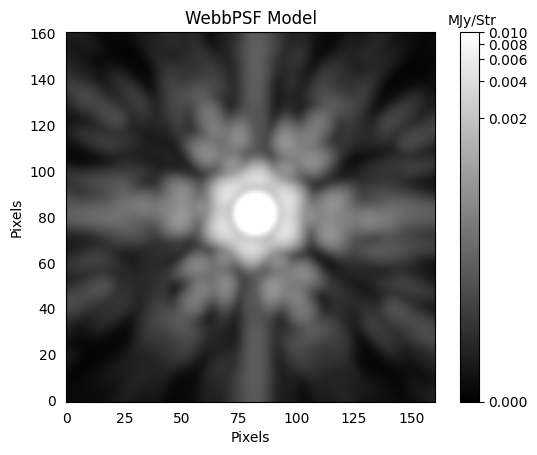

In [49]:
# The scale should highlight the background noise so it is possible to see all faint sources.
ref_cutout = extract_array(psf3.data, (161, 161), (200, 200))
norm1 = simple_norm(ref_cutout, stretch='log', min_cut=0.0, max_cut=0.01)
plt.imshow(ref_cutout, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('WebbPSF Model')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both', color='none')
plt.show()

Finished PSF psf_photometry with median residuals of -3.45%


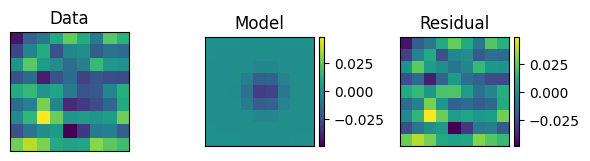

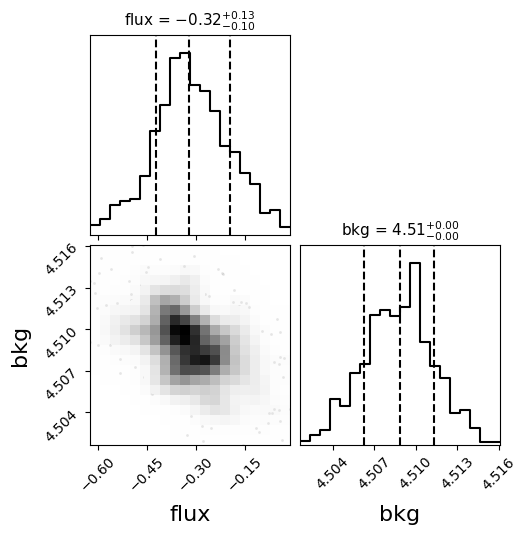

In [50]:
jwst3_obs.psf_photometry(
    psf3,
    source_location,
    bounds={
        'flux': [-1000, 1000],
        # 'centroid': [-2, 2],
        'bkg': [0, 50]
    },
    fit_width=9,
    fit_bkg=True,
    fit_centroid=False,
    fit_flux=True
)

jwst3_obs.plot_psf_fit()
plt.show()

jwst3_obs.plot_psf_posterior(minweight=.0005)
plt.show()

In [51]:
magupper_lvl3psf = jwst3_obs.upper_limit(nsigma=5)
print(round(magupper_lvl2psf[0], 4))
print(round(magupper_lvl3psf[0], 5))

25.6361
25.81344


## Note you can go significantly deeper with the Level3 combined data product

5.<font color='white'>-</font>Stellar Field (LMC)<a class="anchor" id="lmc"></a>
------------------

#### In this case, we are going to do the same steps as in Section 3, but for multiple stars. The purpose is to illustrate the workflow and runtime for using space_phot on a large number of stars. We suggest that space_phot may be less optimal for large numbers of bright stars. Other programs, such as DOLPHOT or Photutils, may be better suited for this use case. The primary advantage to space_phot is on faint, single sources. But it can be extended to a larger number if desired.

### 5.1<font color='white'>-</font>Multiple, Level2 Files<a class="anchor" id="lmc2"></a> ###

##### Now do the same thing for a larger group of stars and test for speed

In [52]:
# Level 3 Files
lvl3 = ["./mast/01171/jw01171-o004_t001_miri_f560w_i2d.fits"]
lvl3

['./mast/01171/jw01171-o004_t001_miri_f560w_i2d.fits']

In [53]:
# Level 2 Files
lvl2 = glob.glob('./mast/01171/jw01171004*cal.fits')
lvl2

['./mast/01171/jw01171004001_02101_00004_mirimage_cal.fits',
 './mast/01171/jw01171004001_02101_00003_mirimage_cal.fits',
 './mast/01171/jw01171004001_02101_00002_mirimage_cal.fits',
 './mast/01171/jw01171004001_02101_00001_mirimage_cal.fits']

In [54]:
# Find Stars in Level 3 File
# Get rough estimate of background (There are Better Ways to Do Background Subtraction)
bkgrms = MADStdBackgroundRMS()
mmm_bkg = MMMBackground()

ref_fits = ImageModel(lvl3[0])
w = ref_fits.get_fits_wcs()

std = bkgrms(ref_fits.data)
bkg = mmm_bkg(ref_fits.data)
data_bkgsub = ref_fits.data.copy()
data_bkgsub -= bkg        
sigma_psf = 1.636 # pixels for F770W
threshold = 5.

daofind = DAOStarFinder(threshold=threshold * std, fwhm=sigma_psf, exclude_border=True)
found_stars = daofind(data_bkgsub)

In [55]:
found_stars.pprint_all(max_lines=10)

 id      xcentroid         ycentroid          sharpness       roundness1      roundness2      npix sky         peak                flux                 mag         
---- ----------------- ------------------ ------------------ ----------- -------------------- ---- --- -------------------- ------------------ ---------------------
   1 546.3366588406968  5.398882130273244 0.7216108098543021  0.42706507   0.0327047943515513   25 0.0  -0.8653272390365601 1.6044420003890991   -0.5133100555790514
   2 579.1090334369383  5.270107063151424 0.7034689294973233 -0.07913096  -0.8541384674101066   25 0.0   -0.670994758605957 1.0608985424041748  -0.06418463180595672
   3 583.2893136620834  5.869637735574443 0.8212823650919728 -0.49647078   0.7449057965878985   25 0.0  -0.5979987382888794 1.4969946146011353   -0.4380505949571353
 ...               ...                ...                ...         ...                  ...  ... ...                  ...                ...                   ...
1020 823.1

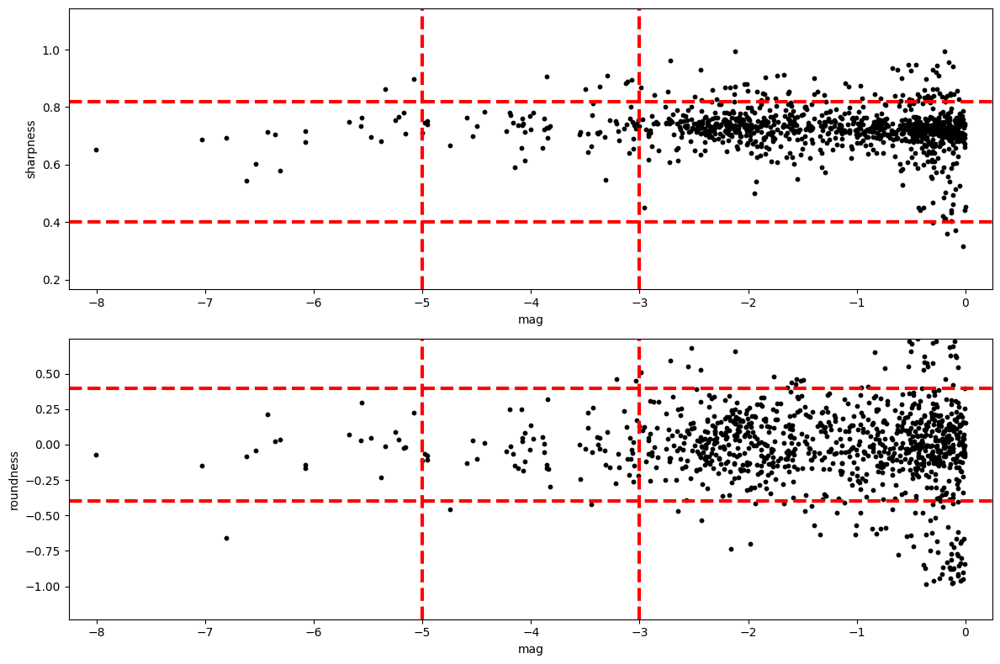

In [56]:
# Filter out only stars you want
plt.figure(figsize=(12, 8))
plt.clf()

ax1 = plt.subplot(2, 1, 1)

ax1.set_xlabel('mag')
ax1.set_ylabel('sharpness')

xlim0 = np.min(found_stars['mag']) - 0.25
xlim1 = np.max(found_stars['mag']) + 0.25
ylim0 = np.min(found_stars['sharpness']) - 0.15
ylim1 = np.max(found_stars['sharpness']) + 0.15

ax1.set_xlim(xlim0, xlim1)
ax1.set_ylim(ylim0, ylim1)

ax1.scatter(found_stars['mag'], found_stars['sharpness'], s=10, color='k')

sh_inf = 0.40
sh_sup = 0.82
#mag_lim = -5.0
lmag_lim = -3.0
umag_lim = -5.0

ax1.plot([xlim0, xlim1], [sh_sup, sh_sup], color='r', lw=3, ls='--')
ax1.plot([xlim0, xlim1], [sh_inf, sh_inf], color='r', lw=3, ls='--')
ax1.plot([lmag_lim, lmag_lim], [ylim0, ylim1], color='r', lw=3, ls='--')
ax1.plot([umag_lim, umag_lim], [ylim0, ylim1], color='r', lw=3, ls='--')

ax2 = plt.subplot(2, 1, 2)

ax2.set_xlabel('mag')
ax2.set_ylabel('roundness')

ylim0 = np.min(found_stars['roundness2']) - 0.25
ylim1 = np.max(found_stars['roundness2']) - 0.25

ax2.set_xlim(xlim0, xlim1)
ax2.set_ylim(ylim0, ylim1)

round_inf = -0.40
round_sup = 0.40

ax2.scatter(found_stars['mag'], found_stars['roundness2'], s=10, color='k')

ax2.plot([xlim0, xlim1], [round_sup, round_sup], color='r', lw=3, ls='--')
ax2.plot([xlim0, xlim1], [round_inf, round_inf], color='r', lw=3, ls='--')
ax2.plot([lmag_lim, lmag_lim], [ylim0, ylim1], color='r', lw=3, ls='--')
ax2.plot([umag_lim, umag_lim], [ylim0, ylim1], color='r', lw=3, ls='--')

plt.tight_layout()

In [57]:
mask = ((found_stars['mag'] < lmag_lim) & (found_stars['mag'] > umag_lim) & (found_stars['roundness2'] > round_inf)
        & (found_stars['roundness2'] < round_sup) & (found_stars['sharpness'] > sh_inf) 
        & (found_stars['sharpness'] < sh_sup) & (found_stars['xcentroid'] > 100) & (found_stars['xcentroid'] < 700)
        & (found_stars['ycentroid'] > 100) & (found_stars['ycentroid'] < 700))

found_stars_sel = found_stars[mask]

print('Number of stars found originally:', len(found_stars))
print('Number of stars in final selection:', len(found_stars_sel))

Number of stars found originally: 1022
Number of stars in final selection: 13


In [58]:
found_stars_sel

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int64,float64,float64,float64,float32,float64,int64,float64,float64,float64,float64
154,378.7447860048902,106.99556381787069,0.746396419837587,-0.060909897,-0.06528081842863379,25,0.0,51.20432662963867,46.19735336303711,-4.161542739066019
163,699.3979436707866,121.32571956929932,0.6839113896426745,-0.44503638,-0.16064184840194462,25,0.0,21.92721176147461,18.855628967285156,-3.18860255936475
215,520.4738859889501,190.2470844467611,0.801939515793906,0.29336134,-0.10283372682390177,25,0.0,23.034168243408203,17.11179542541504,-3.083238948815109
218,591.9608924578399,194.86544163362754,0.7537782857133695,-0.37401316,-0.2174607202451072,25,0.0,21.18755340576172,15.98092269897461,-3.0090046269794324
252,388.9901978969254,248.16827827738035,0.726416615195482,0.20260607,0.2397623279230829,25,0.0,19.440757751464844,18.035749435424805,-3.1403354829247307
270,532.4073709451064,267.73564351673207,0.7293613535465368,-0.2966984,-0.16983160454011637,25,0.0,43.17793273925781,34.43391418457031,-3.8424659819824254
355,671.4881295228383,370.5420770001648,0.6900003175282557,0.20748842,-0.26339732280995043,25,0.0,21.814945220947266,16.73634147644043,-3.059151320785358
425,635.9256442579762,494.58156627181285,0.8118165178964439,-0.07866803,0.25792515575227165,25,0.0,29.927074432373047,23.537675857543945,-3.4294089444763682
502,584.9740628030005,576.5201775316028,0.7828437409321344,-0.21265483,0.009297936681535182,25,0.0,76.73455047607422,58.97472381591797,-4.426664789302999


In [59]:
# Convert pixel to wcs coords
skycoords = w.pixel_to_world(found_stars_sel['xcentroid'], found_stars_sel['ycentroid'])
len(skycoords)

13

In [60]:
# Change all DQ flagged pixels to NANs
for file in lvl2:
    ref_fits = ImageModel(file)
    data = ref_fits.data
    dq = ref_fits.dq
    data[dq >= 10] = np.nan
    ref_fits.data = data
    ref_fits.save(file)

In [61]:
# Create a grid for fast lookup using WebbPSF. The larger the number of grid points, the better the photometric precision.
# Developer note. Would be great to have a fast/approximate look up table. 
jwst_obs = space_phot.observation2(lvl2)
grid = space_phot.util.get_jwst_psf_grid(jwst_obs, num_psfs=4)

Setting up sim to match ./mast/01171/jw01171004001_02101_00004_mirimage_cal.fits



MAST OPD query around UTC: 2022-04-13T03:08:10.578
                        MJD: 59682.13067798611

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/R2022041201-NRCA3_FP1-2.fits
	Date (MJD):	 59681.7791
	Delta time:	 -0.3516 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022041301-NRCA3_FP1-1.fits
	Date (MJD):	 59682.8401
	Delta time:	 0.7094 days
User requested choosing OPD time closest in time to 2022-04-13T03:08:10.578, which is R2022041201-NRCA3_FP1-2.fits, delta time -0.352 days


 [Done]


Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/R2022041201-NRCA3_FP1-2.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F560W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/4: (0, 0) pixels


    Position 1/4 centroid: (201.39896123096594, 201.57462168473992)
    Position 2/4: (0, 1023) pixels


    Position 2/4 centroid: (201.30665784716913, 201.41346936543644)
    Position 3/4: (1023, 0) pixels


    Position 3/4 centroid: (201.44216164335302, 201.69986266797625)
    Position 4/4: (1023, 1023) pixels


    Position 4/4 centroid: (201.77312450805107, 201.60334597442935)
  Saving file: miri_mirim_f560w_fovp101_samp4_npsf4.fits


In [62]:
t = QTable([skycoords], names=["skycoord"])
t.write('skycoord.ecsv', overwrite=True)

Starting 1.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.6875184, -69.44522229)>


Finished PSF psf_photometry with median residuals of 3.66%


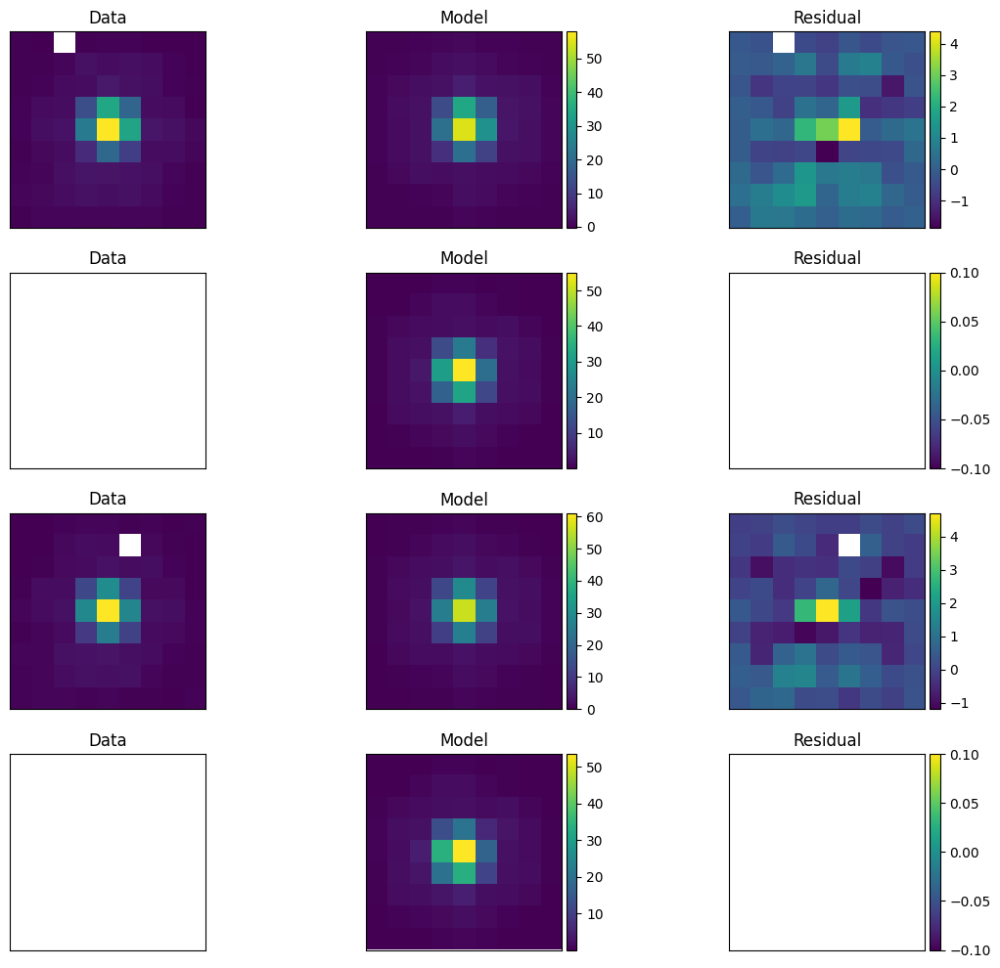

Elapsed Time for Photometry: 19.169411358000048
Starting 2.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.70519765, -69.43753467)>


Finished PSF psf_photometry with median residuals of 2.07%


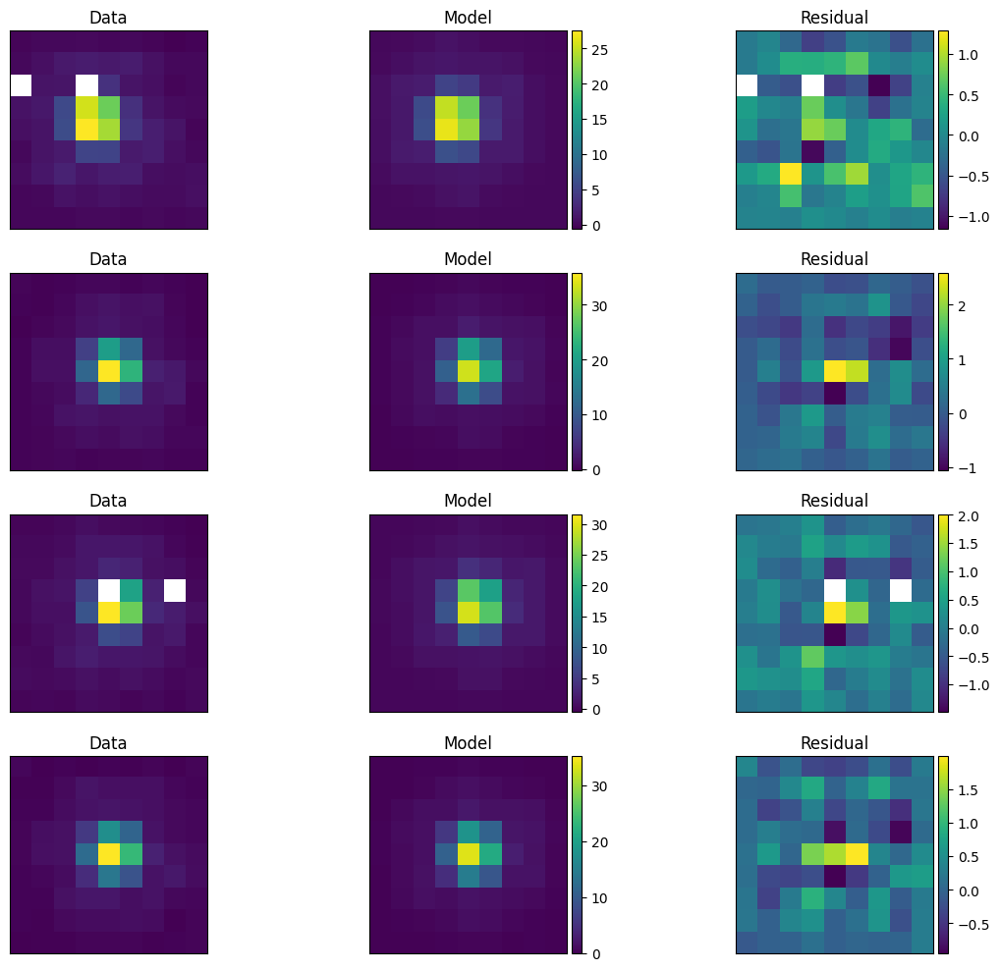

Elapsed Time for Photometry: 28.712075343999913
Starting 3.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.70076463, -69.44322855)>


Finished PSF psf_photometry with median residuals of 2.68%


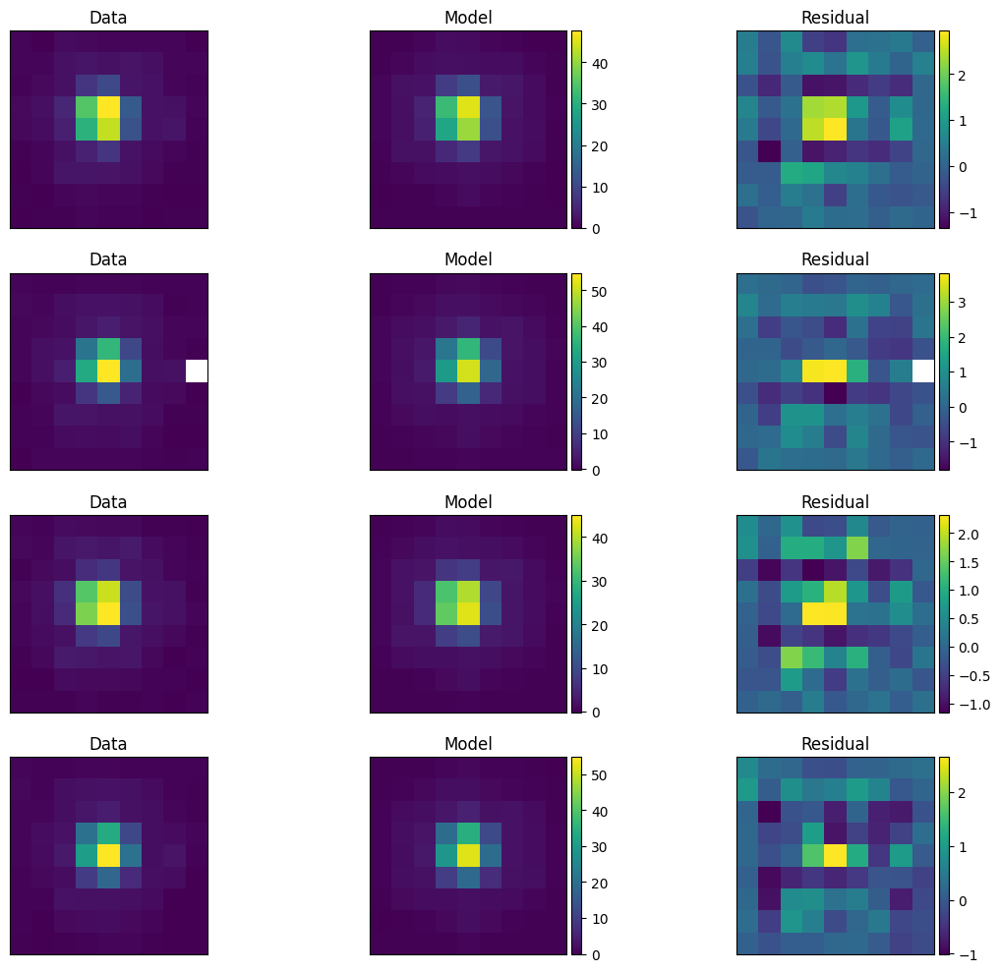

Elapsed Time for Photometry: 31.09890727300001
Starting 4.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.70480626, -69.44154049)>


Finished PSF psf_photometry with median residuals of 2.97%


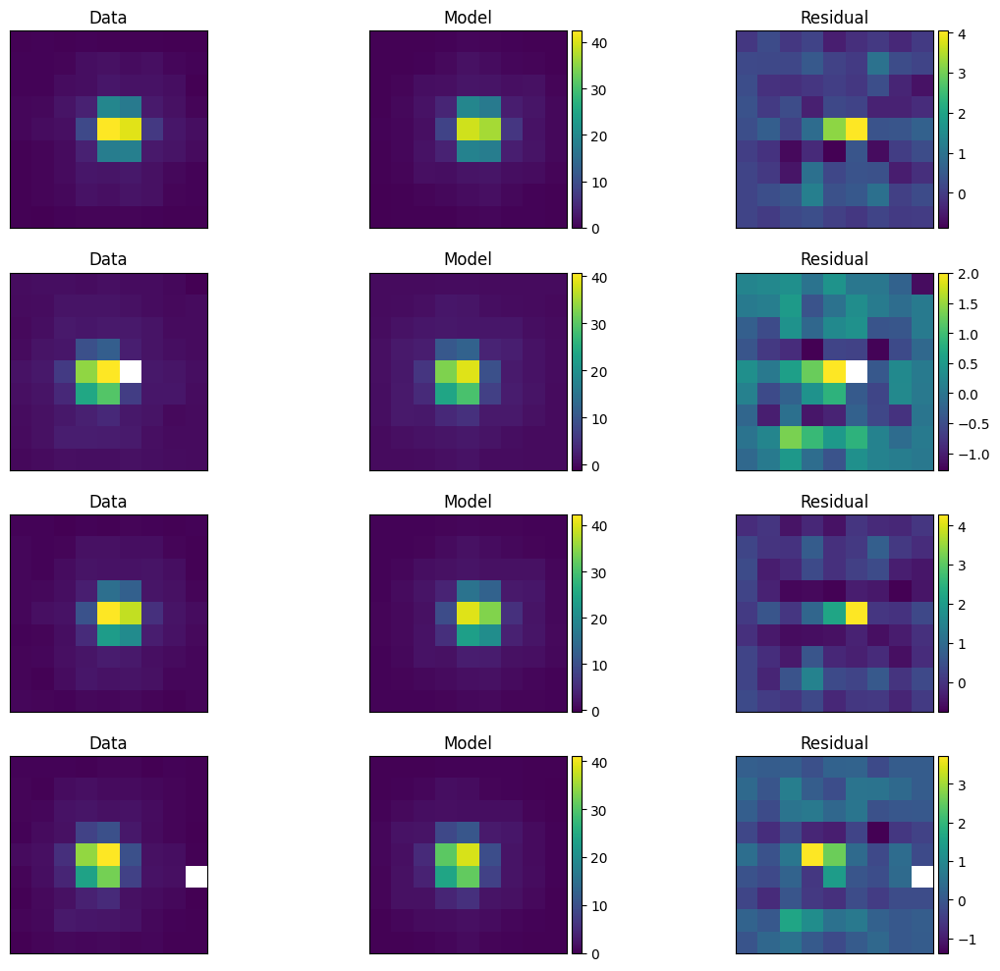

Elapsed Time for Photometry: 31.787859657000013
Starting 5.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.69801915, -69.44754544)>


Finished PSF psf_photometry with median residuals of 1.28%


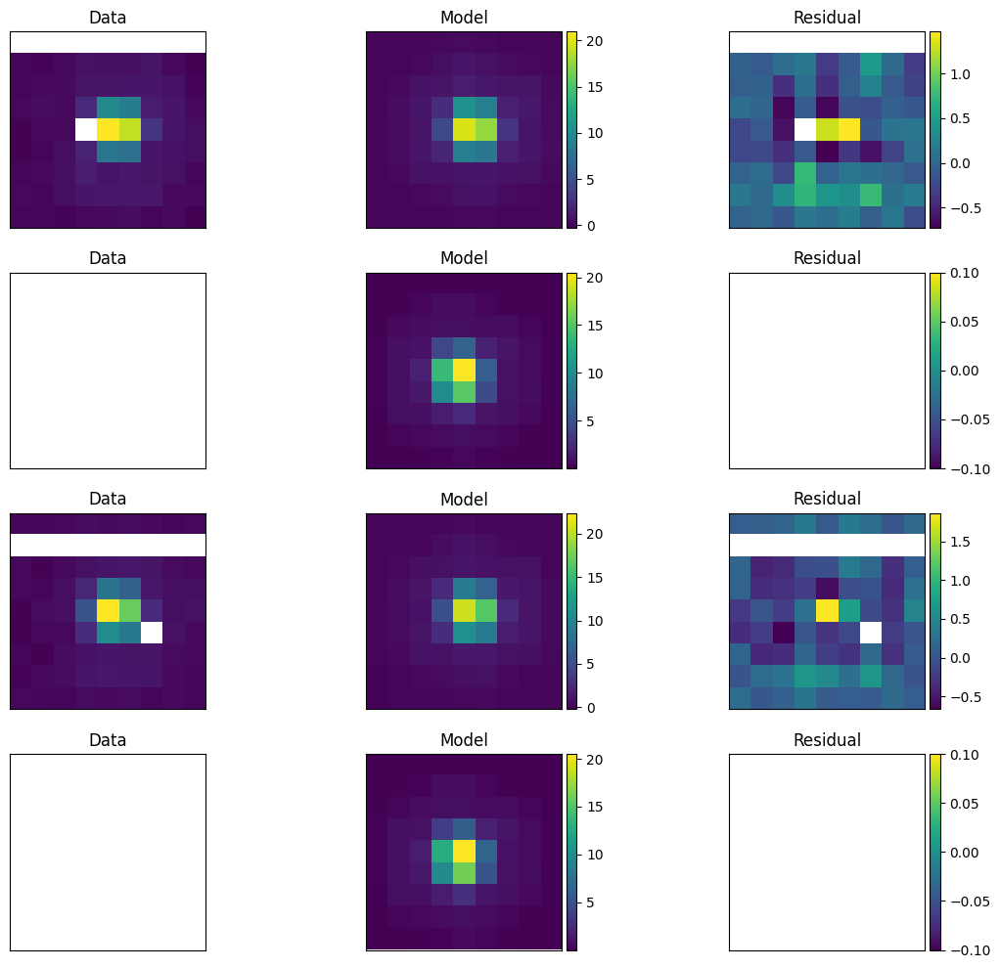

Elapsed Time for Photometry: 19.494438378999916
Starting 6.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.70685634, -69.4443469)>


Finished PSF psf_photometry with median residuals of 3.73%


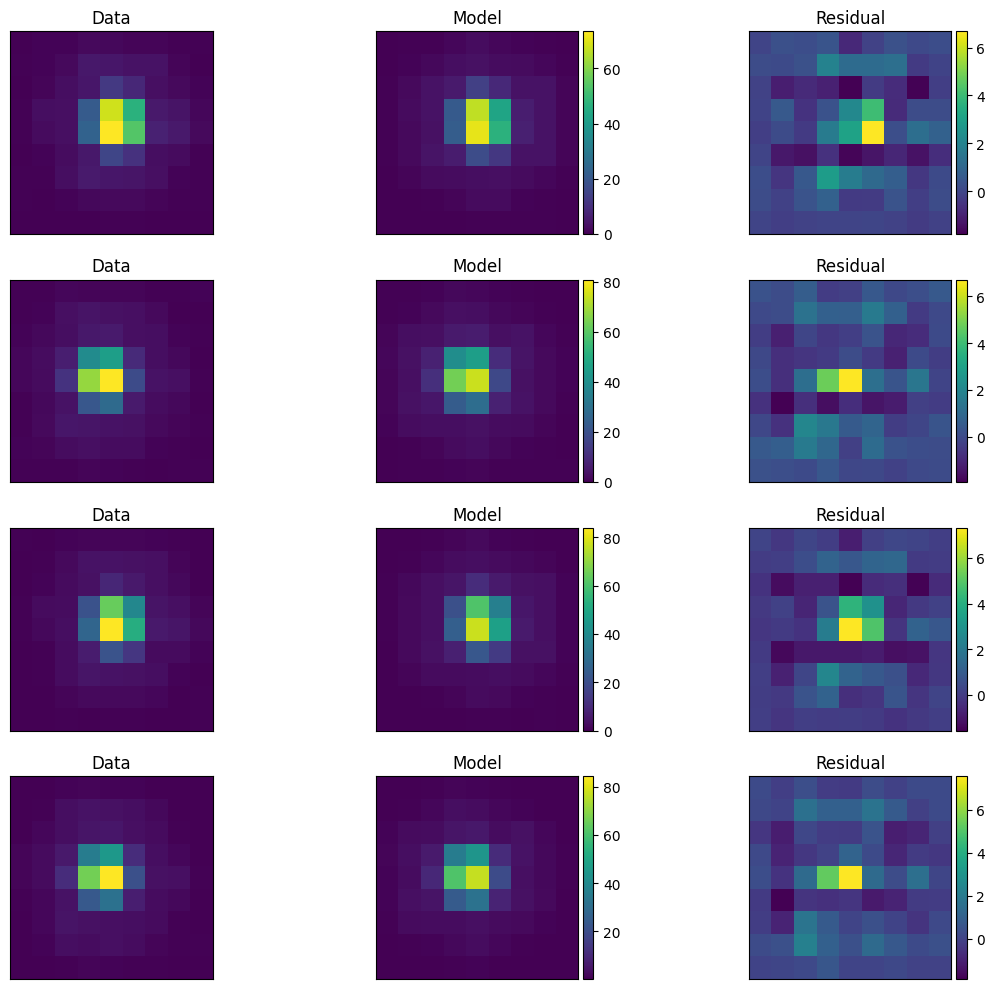

Elapsed Time for Photometry: 28.26133561000006
Starting 7.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.72134362, -69.44277411)>


Finished PSF psf_photometry with median residuals of 1.92%


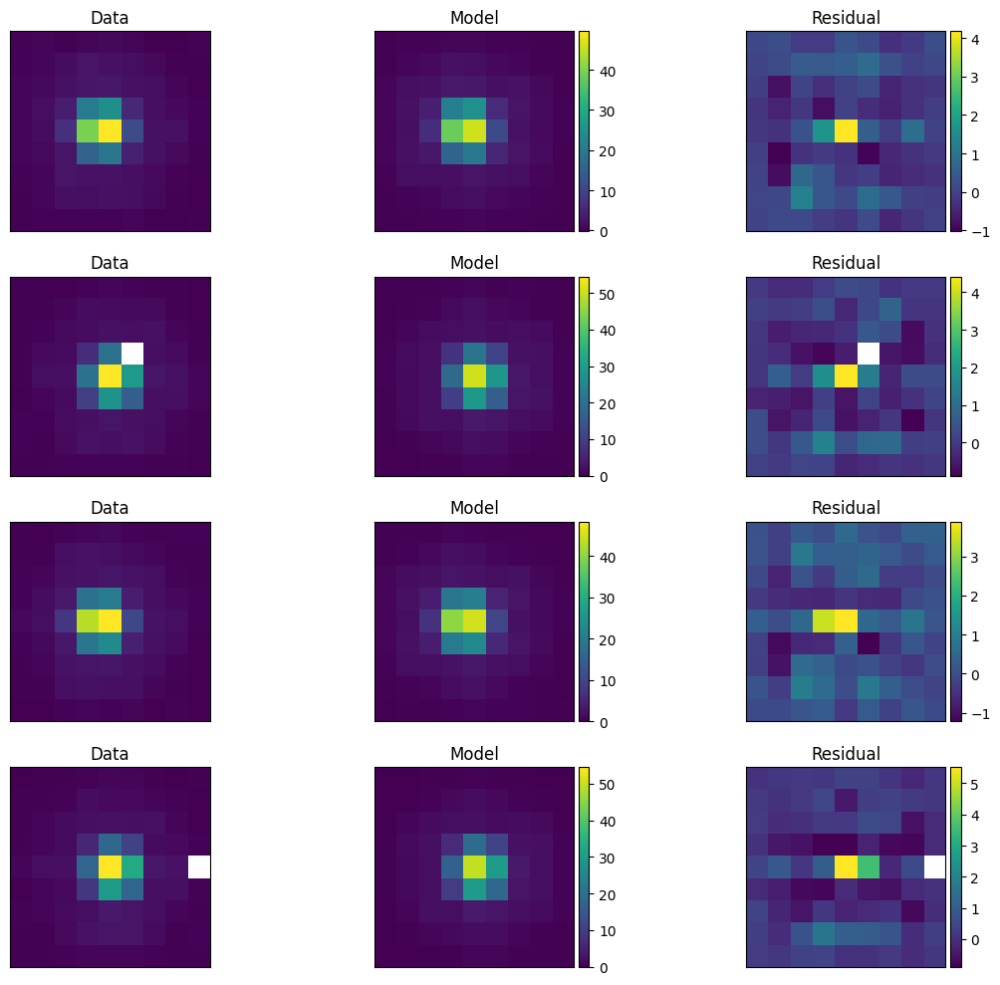

Elapsed Time for Photometry: 39.662753649000024
Starting 8.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.72825681, -69.44591877)>


Finished PSF psf_photometry with median residuals of 2.48%


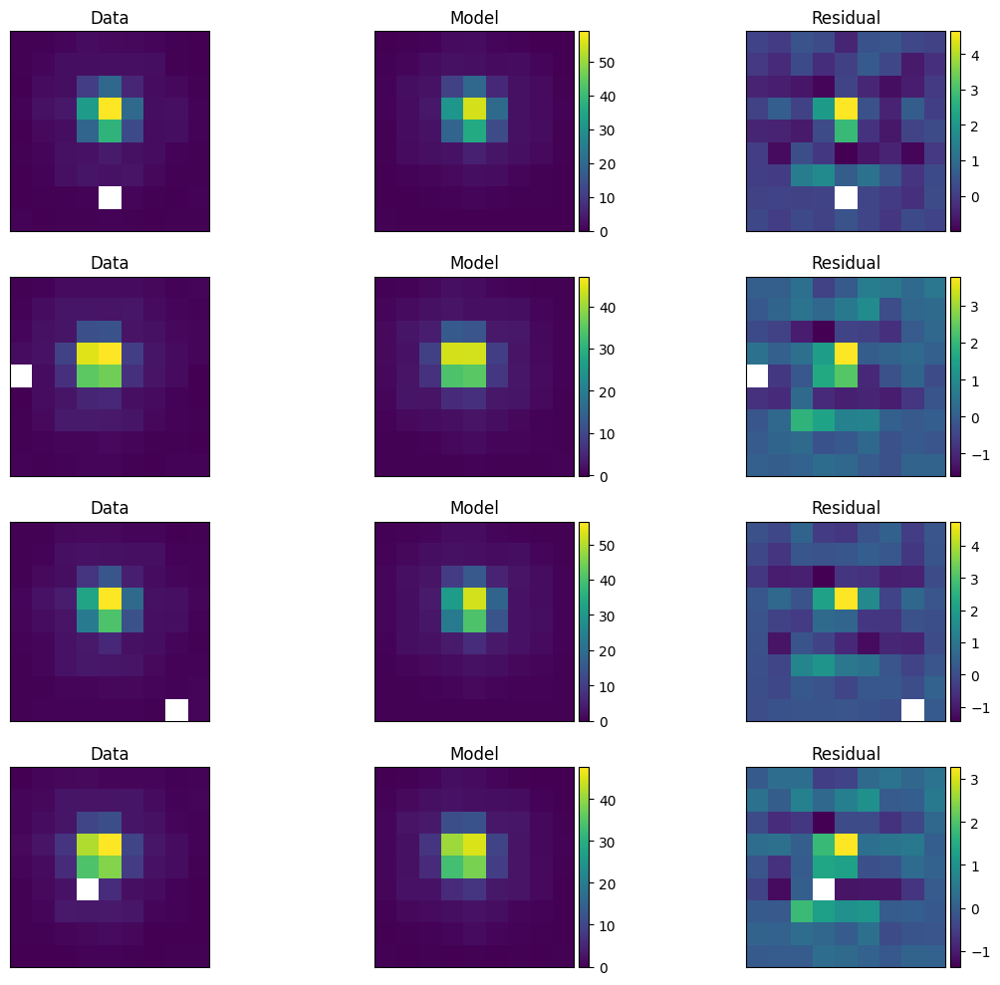

Elapsed Time for Photometry: 51.99780270399992
Starting 9.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.73139798, -69.44867697)>


Finished PSF psf_photometry with median residuals of 5.54%


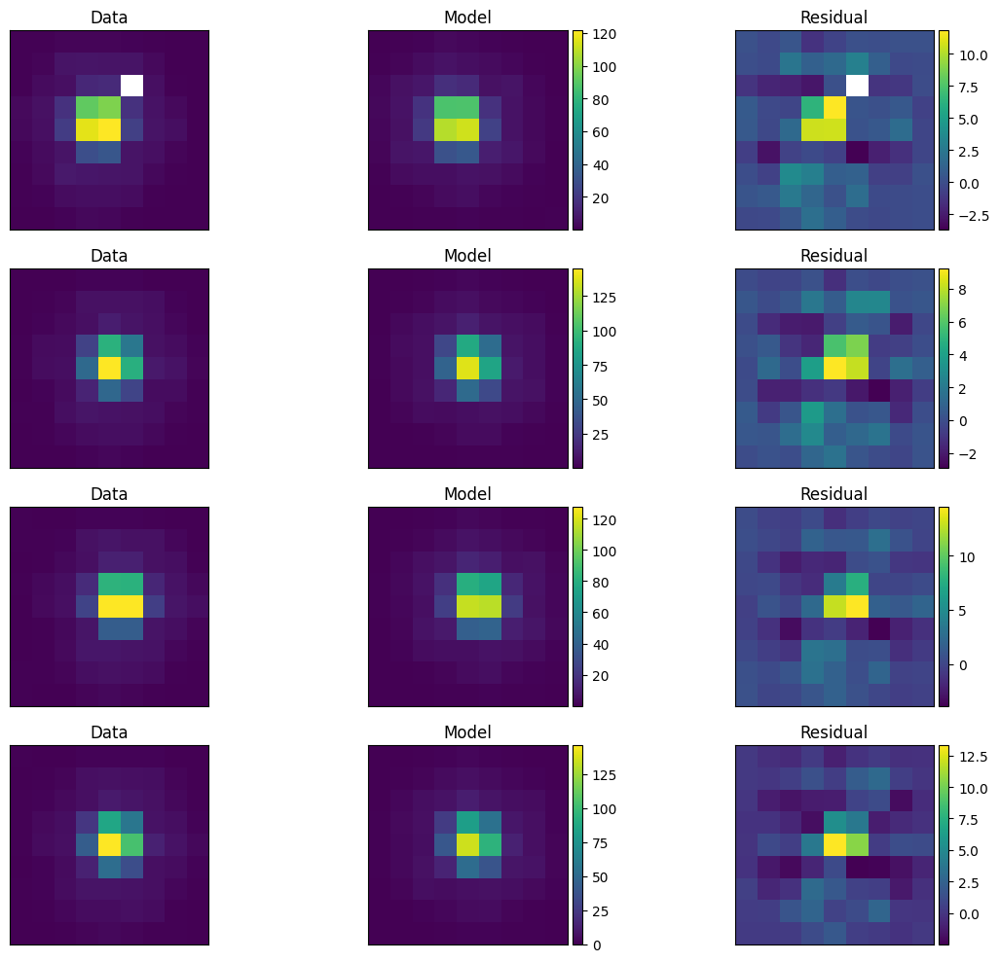

Elapsed Time for Photometry: 28.66691333899996
Starting 10.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.72803877, -69.45133743)>


Finished PSF psf_photometry with median residuals of 4.94%


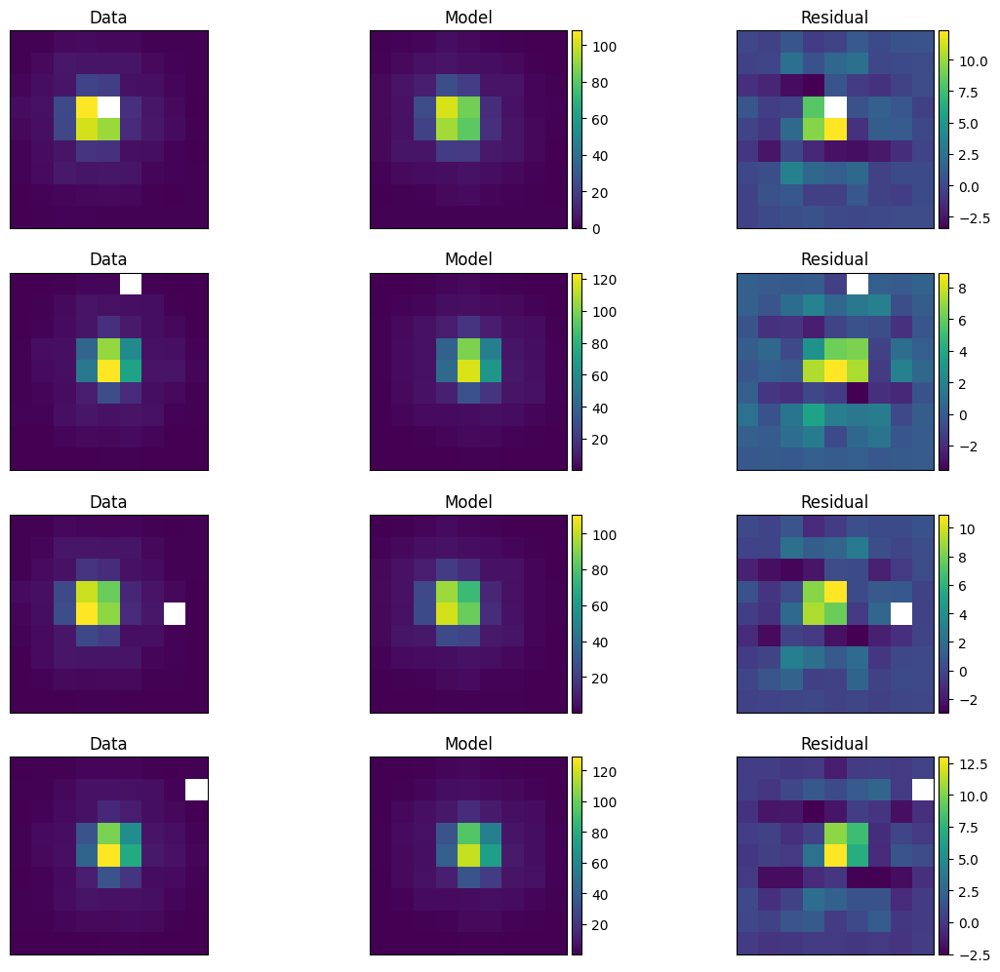

Elapsed Time for Photometry: 28.95111452699996
Starting 11.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.73746115, -69.44890936)>


Finished PSF psf_photometry with median residuals of 3.30%


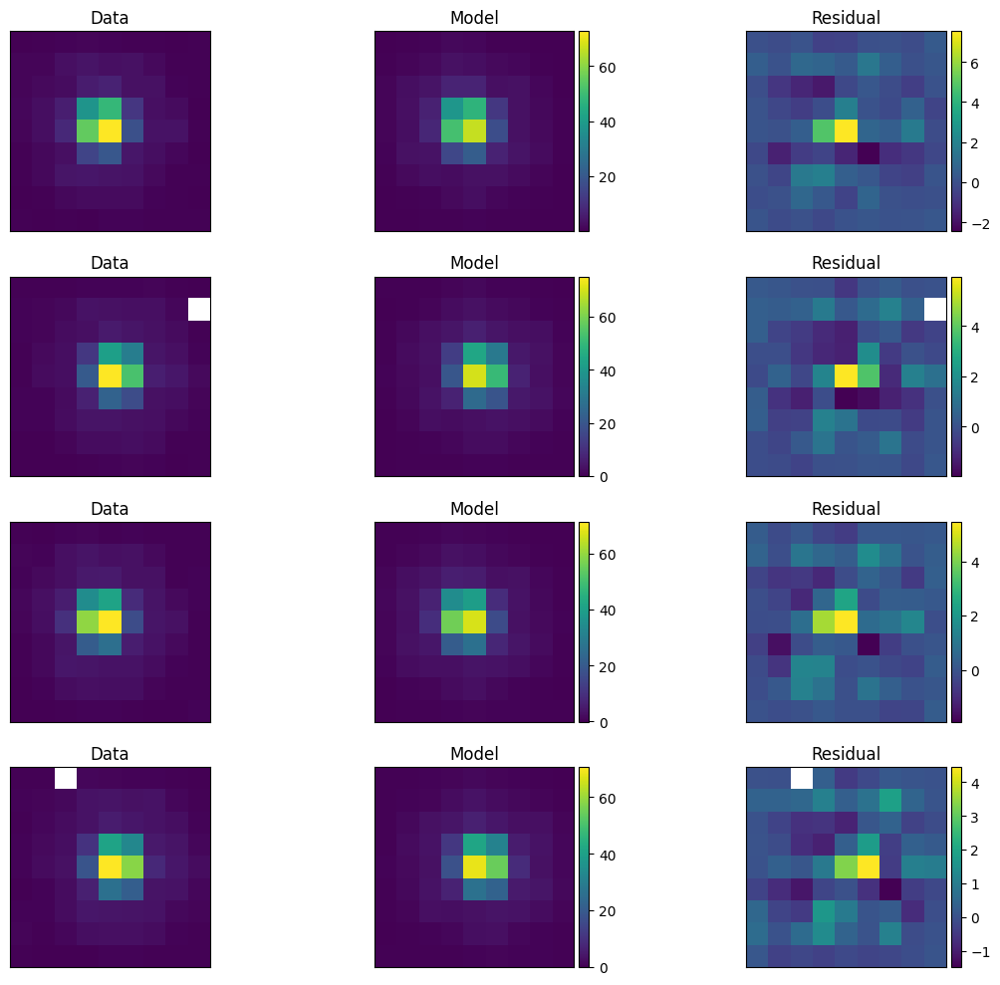

Elapsed Time for Photometry: 31.199620938000066
Starting 12.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.74187347, -69.44817923)>


Finished PSF psf_photometry with median residuals of 59.75%


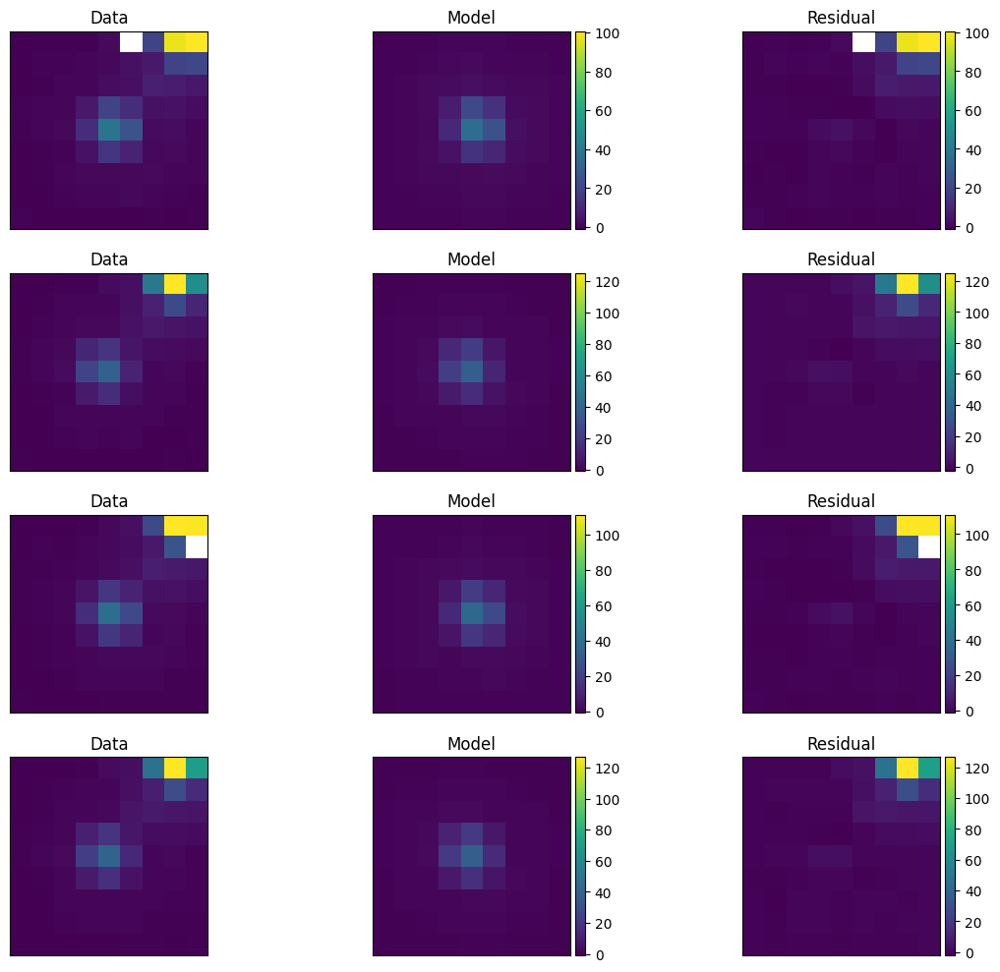

Elapsed Time for Photometry: 34.00642738600004
Starting 13.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.74189746, -69.44834474)>


Finished PSF psf_photometry with median residuals of 17.70%


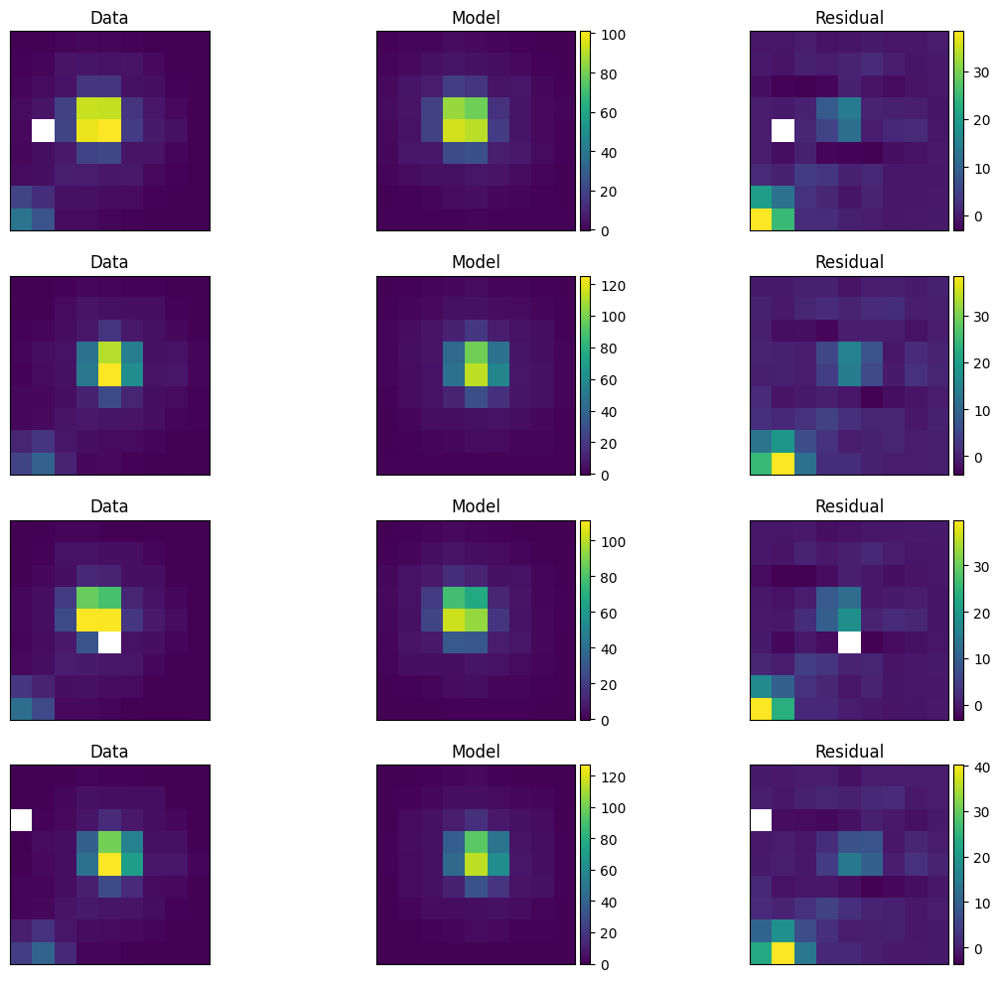

Elapsed Time for Photometry: 27.38631318399996


In [63]:
# Now Loop Through All Stars and Build Photometry Table
# Readers should refer to all diagnostics discussed above. 
# It should be noted that empty plots correspond to LVL2 files with dither positions that do not cover that particular coordinate.
counter = 0.
badindex = []

jwst_obs = space_phot.observation2(lvl2)
for source_location in skycoords:
    tic = time.perf_counter()
    print('Starting', counter+1., ' of', len(skycoords), ':', source_location)
    psfs = space_phot.util.get_jwst_psf_from_grid(jwst_obs, source_location, grid)
    jwst_obs.psf_photometry(psfs, source_location, bounds={'flux': [-100000, 100000],
                            'centroid': [-2., 2.],
                            'bkg': [0, 50]},
                            fit_width=9,
                            fit_bkg=True,
                            fit_flux='single',
                            maxiter=10000)
    
    jwst_obs.plot_psf_fit()
    plt.show()
    
    ra = jwst_obs.psf_result.phot_cal_table['ra'][0]
    dec = jwst_obs.psf_result.phot_cal_table['dec'][0]
    mag_arr = jwst_obs.psf_result.phot_cal_table['mag']
    magerr_arr = jwst_obs.psf_result.phot_cal_table['magerr']
    mag_lvl2psf = np.mean(mag_arr)
    magerr_lvl2psf = math.sqrt(sum(p**2 for p in magerr_arr))

    if counter == 0:
        df = pd.DataFrame(np.array([[ra, dec, mag_lvl2psf, magerr_lvl2psf]]), columns=['ra', 'dec', 'mag', 'magerr'])
    else:
        df = pd.concat([df, pd.DataFrame(np.array([[ra, dec, mag_lvl2psf, magerr_lvl2psf]]), columns=['ra', 'dec', 'mag', 'magerr'])], ignore_index=True)
    counter = counter + 1.
    
    toc = time.perf_counter()
    print("Elapsed Time for Photometry:", toc - tic)

In [64]:
df

,ra,dec,mag,magerr
0,80.687509,-69.445224,18.887427,0.007685
1,80.705202,-69.437531,19.414112,0.006510
2,80.700771,-69.443235,18.927437,0.005284
3,80.704789,-69.441546,19.108198,0.005637
4,80.698004,-69.447549,19.872468,0.011260
5,80.706844,-69.444349,18.436834,0.004292
6,80.721349,-69.442773,18.982821,0.005462
7,80.728230,-69.445926,18.864782,0.004729
8,80.731419,-69.448673,17.858025,0.003220
9,80.728022,-69.451340,17.965327,0.003422


### 5.2<font color='white'>-</font>Single, Level3 Mosaicked File<a class="anchor" id="lmc3"></a> ###

In [65]:
lvl2[0]

'./mast/01171/jw01171004001_02101_00004_mirimage_cal.fits'

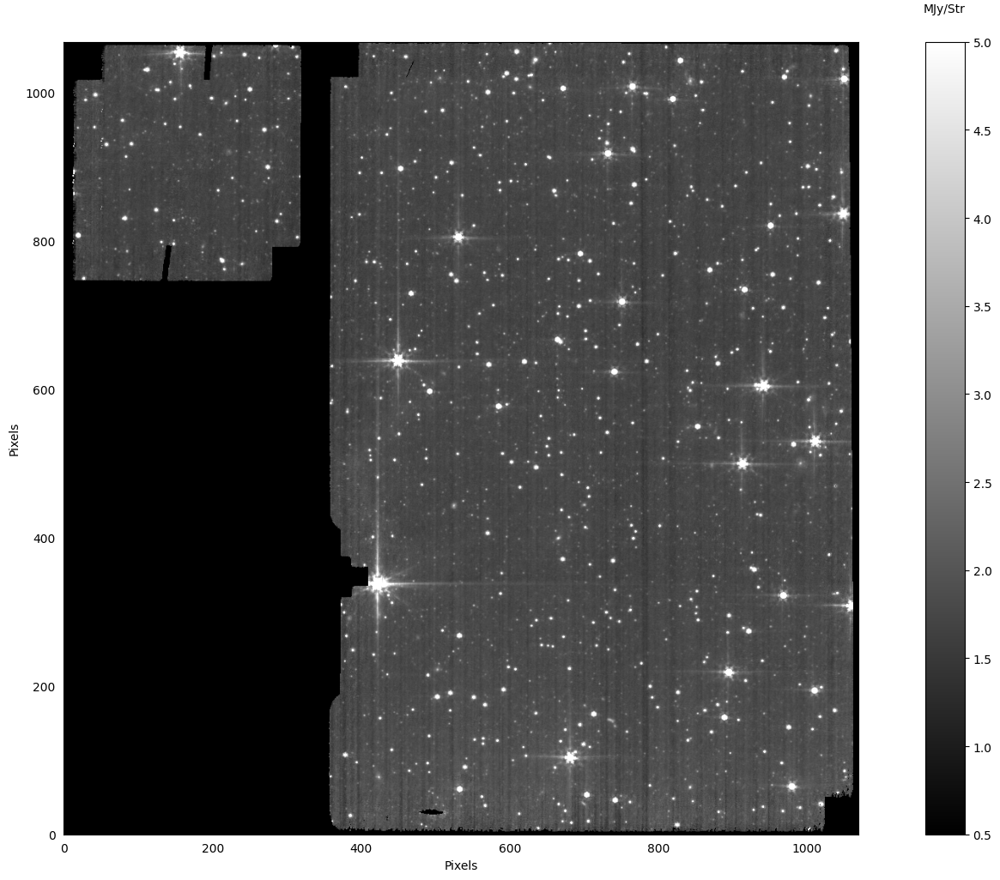

In [66]:
# Now do the same photometry on the Level 3 Data
ref_image = lvl3[0]

ref_fits = ImageModel(ref_image)
ref_data = ref_fits.data
norm1 = simple_norm(ref_data, stretch='linear', min_cut=0.5, max_cut=5)

plt.figure(figsize=(20, 12))
plt.imshow(ref_data, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.gca().tick_params(axis='both', color='none')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.show()

In [67]:
# Get PSF from WebbPSF and drizzle it to the source location
jwst3_obs = space_phot.observation3(lvl3[0])

In [68]:
lvl3[0]

'./mast/01171/jw01171-o004_t001_miri_f560w_i2d.fits'

In [69]:
skycoords

<SkyCoord (ICRS): (ra, dec) in deg
    [(80.6875184 , -69.44522229), (80.70519765, -69.43753467),
     (80.70076463, -69.44322855), (80.70480626, -69.44154049),
     (80.69801915, -69.44754544), (80.70685634, -69.4443469 ),
     (80.72134362, -69.44277411), (80.72825681, -69.44591877),
     (80.73139798, -69.44867697), (80.72803877, -69.45133743),
     (80.73746115, -69.44890936), (80.74187347, -69.44817923),
     (80.74189746, -69.44834474)]>

#### Readers should refer to all diagnostics discussed above. In general, this loop shows the difficulty in doing PSF photometry on a wide variety of stars (brightness, distribution on the detector, etc) without visual inspection. Especially when dealing with low SNR sources.This is true for all photometry packages. Users should inspect the associated metrics and consider optimizing the parameters for specific stars of interest. Nonetheless, the success of the fits can always be quantified in with the associated error bars.


Starting 1.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.6875184, -69.44522229)>
Setting up sim to match ./mast/01171/jw01171004001_02101_00004_mirimage_cal.fits



MAST OPD query around UTC: 2022-04-13T03:08:10.578
                        MJD: 59682.13067798611

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/R2022041201-NRCA3_FP1-2.fits
	Date (MJD):	 59681.7791
	Delta time:	 -0.3516 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022041301-NRCA3_FP1-1.fits
	Date (MJD):	 59682.8401
	Delta time:	 0.7094 days
User requested choosing OPD time closest in time to 2022-04-13T03:08:10.578, which is R2022041201-NRCA3_FP1-2.fits, delta time -0.352 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/R2022041201-NRCA3_FP1-2.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F560W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(108.16016136), array(378.91287696)) pixels


    Position 1/1 centroid: (201.36457069453377, 201.7782739113487)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(60.77951216), array(341.19525753)) pixels


    Position 1/1 centroid: (201.32020140480185, 201.7927421539016)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(105.05489775), array(378.04020065)) pixels


    Position 1/1 centroid: (201.36232944983183, 201.77970029627062)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(57.78188432), array(340.24354019)) pixels


    Position 1/1 centroid: (201.31773175959825, 201.79372349979025)


2025-01-10 19:41:35,699 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2025-01-10 19:41:35,700 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2025-01-10 19:41:35,702 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2025-01-10 19:41:35,704 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2025-01-10 19:41:35,705 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2025-01-10 19:41:35,707 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2025-01-10 19:41:35,708 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2025-01-10 19:41:35,895 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('./temp_psf_dir/cal_data_asn.json',).


2025-01-10 19:41:35,908 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: ./temp_psf_dir
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: False


2025-01-10 19:41:35,909 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2025-01-10 19:41:36,380 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3aa201d0>,).


2025-01-10 19:41:36,380 - stpipe.Image3Pipeline.tweakreg - INFO - Step skipped.


2025-01-10 19:41:37,269 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3aa201d0>,).


2025-01-10 19:41:37,270 - stpipe.Image3Pipeline.skymatch - INFO - Step skipped.


2025-01-10 19:41:37,470 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3aa201d0>,).


2025-01-10 19:41:37,471 - stpipe.Image3Pipeline.outlier_detection - INFO - Step skipped.


2025-01-10 19:41:37,662 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3aa201d0>,).


2025-01-10 19:41:37,663 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:41:37,664 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:41:37,664 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:41:37,665 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:41:37,666 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:41:37,667 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:41:37,667 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:41:37,668 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:41:37,669 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:41:37,670 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:41:37,670 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:41:37,671 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:41:37,672 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:41:37,673 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:41:37,673 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:41:37,673 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:41:37,675 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2025-01-10 19:41:37,676 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2025-01-10 19:41:37,676 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2025-01-10 19:41:37,676 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2025-01-10 19:41:37,677 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale: 0.11082930390039995 arcsec.


2025-01-10 19:41:37,695 - stpipe.Image3Pipeline.resample - INFO - Resampling science and variance data


2025-01-10 19:41:38,489 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:41:38,490 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:41:38,490 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:41:39,239 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:41:39,240 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:41:39,241 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:41:40,002 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:41:40,003 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:41:40,004 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:41:40,753 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:41:40,754 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:41:40,755 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:41:40,993 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  80.660307842 -69.452650714 80.735816161 -69.472158466 80.791402231 -69.445614065 80.715936684 -69.426130394


2025-01-10 19:41:41,297 - stpipe.Image3Pipeline.resample - INFO - Saved model in ./temp_psf_dir/temp_psf_cals_i2d.fits


2025-01-10 19:41:41,298 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2025-01-10 19:41:41,495 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(1069, 1070) from temp_psf_cals_i2d.fits>,).


2025-01-10 19:41:41,496 - stpipe.Image3Pipeline.source_catalog - INFO - Step skipped.


2025-01-10 19:41:41,499 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2025-01-10 19:41:41,500 - stpipe - INFO - Results used jwst version: 1.17.1


Finished PSF psf_photometry with median residuals of 2.19%


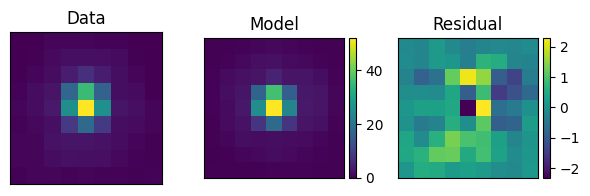

Elapsed Time for Photometry: 29.15438626499997
Starting 2.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.70519765, -69.43753467)>
Setting up sim to match ./mast/01171/jw01171004001_02101_00004_mirimage_cal.fits



MAST OPD query around UTC: 2022-04-13T03:08:10.578
                        MJD: 59682.13067798611

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/R2022041201-NRCA3_FP1-2.fits
	Date (MJD):	 59681.7791
	Delta time:	 -0.3516 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022041301-NRCA3_FP1-1.fits
	Date (MJD):	 59682.8401
	Delta time:	 0.7094 days
User requested choosing OPD time closest in time to 2022-04-13T03:08:10.578, which is R2022041201-NRCA3_FP1-2.fits, delta time -0.352 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/R2022041201-NRCA3_FP1-2.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F560W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(123.55715254), array(699.52894191)) pixels


    Position 1/1 centroid: (201.34368596613945, 201.7628797397261)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(76.318041), array(661.79144185)) pixels


    Position 1/1 centroid: (201.32154273036554, 201.80099578112635)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(120.45650977), array(698.65297148)) pixels


    Position 1/1 centroid: (201.34212605742846, 201.76493480669592)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(73.33050953), array(660.83890567)) pixels


    Position 1/1 centroid: (201.31952743828327, 201.80291255054078)


2025-01-10 19:42:04,076 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2025-01-10 19:42:04,077 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2025-01-10 19:42:04,080 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2025-01-10 19:42:04,082 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2025-01-10 19:42:04,083 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2025-01-10 19:42:04,085 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2025-01-10 19:42:04,086 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2025-01-10 19:42:04,285 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('./temp_psf_dir/cal_data_asn.json',).


2025-01-10 19:42:04,299 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: ./temp_psf_dir
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: False


2025-01-10 19:42:04,299 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2025-01-10 19:42:04,785 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3c0c6450>,).


2025-01-10 19:42:04,785 - stpipe.Image3Pipeline.tweakreg - INFO - Step skipped.


2025-01-10 19:42:05,699 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3c0c6450>,).


2025-01-10 19:42:05,699 - stpipe.Image3Pipeline.skymatch - INFO - Step skipped.


2025-01-10 19:42:05,895 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3c0c6450>,).


2025-01-10 19:42:05,896 - stpipe.Image3Pipeline.outlier_detection - INFO - Step skipped.


2025-01-10 19:42:06,086 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3c0c6450>,).


2025-01-10 19:42:06,088 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:42:06,088 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:42:06,089 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:42:06,089 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:42:06,091 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:42:06,092 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:42:06,092 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:42:06,092 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:42:06,094 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:42:06,094 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:42:06,095 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:42:06,095 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:42:06,097 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:42:06,097 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:42:06,098 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:42:06,098 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:42:06,100 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2025-01-10 19:42:06,100 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2025-01-10 19:42:06,100 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2025-01-10 19:42:06,101 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2025-01-10 19:42:06,101 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale: 0.11082930390039995 arcsec.


2025-01-10 19:42:06,120 - stpipe.Image3Pipeline.resample - INFO - Resampling science and variance data


2025-01-10 19:42:06,911 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:06,913 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:06,913 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:07,666 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:07,668 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:07,668 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:08,426 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:08,427 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:08,428 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:09,171 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:09,173 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:09,173 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:09,411 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  80.660307842 -69.452650714 80.735816161 -69.472158466 80.791402231 -69.445614065 80.715936684 -69.426130394


2025-01-10 19:42:09,711 - stpipe.Image3Pipeline.resample - INFO - Saved model in ./temp_psf_dir/temp_psf_cals_i2d.fits


2025-01-10 19:42:09,712 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2025-01-10 19:42:09,908 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(1069, 1070) from temp_psf_cals_i2d.fits>,).


2025-01-10 19:42:09,909 - stpipe.Image3Pipeline.source_catalog - INFO - Step skipped.


2025-01-10 19:42:09,915 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2025-01-10 19:42:09,915 - stpipe - INFO - Results used jwst version: 1.17.1


Finished PSF psf_photometry with median residuals of 1.89%


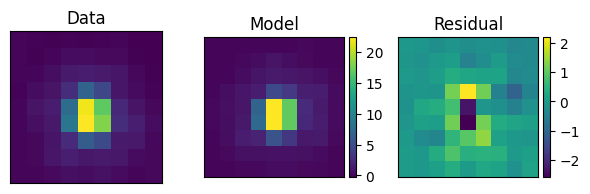

Elapsed Time for Photometry: 28.200233417999925
Starting 3.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.70076463, -69.44322855)>
Setting up sim to match ./mast/01171/jw01171004001_02101_00004_mirimage_cal.fits



MAST OPD query around UTC: 2022-04-13T03:08:10.578
                        MJD: 59682.13067798611

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/R2022041201-NRCA3_FP1-2.fits
	Date (MJD):	 59681.7791
	Delta time:	 -0.3516 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022041301-NRCA3_FP1-1.fits
	Date (MJD):	 59682.8401
	Delta time:	 0.7094 days
User requested choosing OPD time closest in time to 2022-04-13T03:08:10.578, which is R2022041201-NRCA3_FP1-2.fits, delta time -0.352 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/R2022041201-NRCA3_FP1-2.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F560W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(192.62459502), array(520.63589611)) pixels


    Position 1/1 centroid: (201.4376289597017, 201.7338225119554)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(145.69349681), array(482.90572377)) pixels


    Position 1/1 centroid: (201.40682507982595, 201.75980292521777)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(189.54438243), array(519.76159984)) pixels


    Position 1/1 centroid: (201.4356507491598, 201.73578899876756)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(142.72676529), array(481.95371219)) pixels


    Position 1/1 centroid: (201.4046449086048, 201.76147939328513)


2025-01-10 19:42:32,489 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2025-01-10 19:42:32,490 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2025-01-10 19:42:32,493 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2025-01-10 19:42:32,494 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2025-01-10 19:42:32,496 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2025-01-10 19:42:32,497 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2025-01-10 19:42:32,498 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2025-01-10 19:42:32,701 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('./temp_psf_dir/cal_data_asn.json',).


2025-01-10 19:42:32,714 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: ./temp_psf_dir
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: False


2025-01-10 19:42:32,715 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2025-01-10 19:42:33,211 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd368761d0>,).


2025-01-10 19:42:33,212 - stpipe.Image3Pipeline.tweakreg - INFO - Step skipped.


2025-01-10 19:42:34,124 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd368761d0>,).


2025-01-10 19:42:34,125 - stpipe.Image3Pipeline.skymatch - INFO - Step skipped.


2025-01-10 19:42:34,332 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd368761d0>,).


2025-01-10 19:42:34,332 - stpipe.Image3Pipeline.outlier_detection - INFO - Step skipped.


2025-01-10 19:42:34,538 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd368761d0>,).


2025-01-10 19:42:34,539 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:42:34,540 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:42:34,540 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:42:34,541 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:42:34,542 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:42:34,543 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:42:34,543 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:42:34,543 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:42:34,545 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:42:34,545 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:42:34,546 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:42:34,546 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:42:34,548 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:42:34,548 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:42:34,548 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:42:34,549 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:42:34,550 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2025-01-10 19:42:34,551 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2025-01-10 19:42:34,551 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2025-01-10 19:42:34,552 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2025-01-10 19:42:34,552 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale: 0.11082930390039995 arcsec.


2025-01-10 19:42:34,571 - stpipe.Image3Pipeline.resample - INFO - Resampling science and variance data


2025-01-10 19:42:35,359 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:35,361 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:35,361 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:36,158 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:36,159 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:36,160 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:36,914 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:36,915 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:36,916 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:37,659 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:37,661 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:37,661 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:42:37,901 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  80.660307842 -69.452650714 80.735816161 -69.472158466 80.791402231 -69.445614065 80.715936684 -69.426130394


2025-01-10 19:42:38,200 - stpipe.Image3Pipeline.resample - INFO - Saved model in ./temp_psf_dir/temp_psf_cals_i2d.fits


2025-01-10 19:42:38,201 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2025-01-10 19:42:38,408 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(1069, 1070) from temp_psf_cals_i2d.fits>,).


2025-01-10 19:42:38,409 - stpipe.Image3Pipeline.source_catalog - INFO - Step skipped.


2025-01-10 19:42:38,413 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2025-01-10 19:42:38,414 - stpipe - INFO - Results used jwst version: 1.17.1


Finished PSF psf_photometry with median residuals of 8.72%


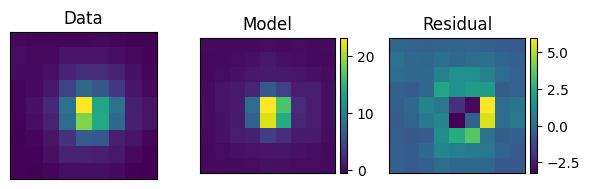

Elapsed Time for Photometry: 28.585865769999828
Starting 4.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.70480626, -69.44154049)>
Setting up sim to match ./mast/01171/jw01171004001_02101_00004_mirimage_cal.fits



MAST OPD query around UTC: 2022-04-13T03:08:10.578
                        MJD: 59682.13067798611

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/R2022041201-NRCA3_FP1-2.fits
	Date (MJD):	 59681.7791
	Delta time:	 -0.3516 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022041301-NRCA3_FP1-1.fits
	Date (MJD):	 59682.8401
	Delta time:	 0.7094 days
User requested choosing OPD time closest in time to 2022-04-13T03:08:10.578, which is R2022041201-NRCA3_FP1-2.fits, delta time -0.352 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/R2022041201-NRCA3_FP1-2.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F560W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(197.467415), array(592.14073978)) pixels


    Position 1/1 centroid: (201.4281791950631, 201.7292804042469)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(150.55259302), array(554.39246167)) pixels


    Position 1/1 centroid: (201.40303159992743, 201.75946826849326)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(194.38780581), array(591.26491374)) pixels


    Position 1/1 centroid: (201.42642198482469, 201.7313614449224)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(147.58760193), array(553.43941275)) pixels


    Position 1/1 centroid: (201.4009030162979, 201.7613121831568)


2025-01-10 19:43:00,975 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2025-01-10 19:43:00,976 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2025-01-10 19:43:00,978 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2025-01-10 19:43:00,979 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2025-01-10 19:43:00,981 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2025-01-10 19:43:00,982 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2025-01-10 19:43:00,983 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2025-01-10 19:43:01,188 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('./temp_psf_dir/cal_data_asn.json',).


2025-01-10 19:43:01,201 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: ./temp_psf_dir
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: False


2025-01-10 19:43:01,202 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2025-01-10 19:43:01,691 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3b319a50>,).


2025-01-10 19:43:01,692 - stpipe.Image3Pipeline.tweakreg - INFO - Step skipped.


2025-01-10 19:43:02,607 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3b319a50>,).


2025-01-10 19:43:02,607 - stpipe.Image3Pipeline.skymatch - INFO - Step skipped.


2025-01-10 19:43:02,815 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3b319a50>,).


2025-01-10 19:43:02,816 - stpipe.Image3Pipeline.outlier_detection - INFO - Step skipped.


2025-01-10 19:43:03,024 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3b319a50>,).


2025-01-10 19:43:03,026 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:43:03,026 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:43:03,026 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:43:03,027 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:43:03,029 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:43:03,029 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:43:03,029 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:43:03,030 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:43:03,031 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:43:03,032 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:43:03,032 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:43:03,032 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:43:03,034 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:43:03,034 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:43:03,035 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:43:03,035 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:43:03,037 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2025-01-10 19:43:03,037 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2025-01-10 19:43:03,038 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2025-01-10 19:43:03,039 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2025-01-10 19:43:03,039 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale: 0.11082930390039995 arcsec.


2025-01-10 19:43:03,057 - stpipe.Image3Pipeline.resample - INFO - Resampling science and variance data


2025-01-10 19:43:03,852 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:03,853 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:03,854 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:04,601 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:04,602 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:04,602 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:05,362 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:05,363 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:05,363 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:06,110 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:06,111 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:06,112 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:06,353 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  80.660307842 -69.452650714 80.735816161 -69.472158466 80.791402231 -69.445614065 80.715936684 -69.426130394


2025-01-10 19:43:06,658 - stpipe.Image3Pipeline.resample - INFO - Saved model in ./temp_psf_dir/temp_psf_cals_i2d.fits


2025-01-10 19:43:06,658 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2025-01-10 19:43:06,871 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(1069, 1070) from temp_psf_cals_i2d.fits>,).


2025-01-10 19:43:06,872 - stpipe.Image3Pipeline.source_catalog - INFO - Step skipped.


2025-01-10 19:43:06,875 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2025-01-10 19:43:06,876 - stpipe - INFO - Results used jwst version: 1.17.1


Finished PSF psf_photometry with median residuals of 7.17%


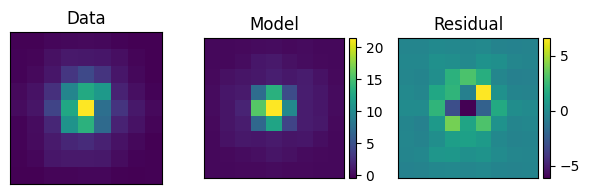

Elapsed Time for Photometry: 28.451313242000197
Starting 5.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.69801915, -69.44754544)>
Setting up sim to match ./mast/01171/jw01171004001_02101_00004_mirimage_cal.fits



MAST OPD query around UTC: 2022-04-13T03:08:10.578
                        MJD: 59682.13067798611

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/R2022041201-NRCA3_FP1-2.fits
	Date (MJD):	 59681.7791
	Delta time:	 -0.3516 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022041301-NRCA3_FP1-1.fits
	Date (MJD):	 59682.8401
	Delta time:	 0.7094 days
User requested choosing OPD time closest in time to 2022-04-13T03:08:10.578, which is R2022041201-NRCA3_FP1-2.fits, delta time -0.352 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/R2022041201-NRCA3_FP1-2.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F560W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(250.47819928), array(389.03371324)) pixels


    Position 1/1 centroid: (201.46095337680683, 201.6980593948559)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(203.72919918), array(351.32263788)) pixels


    Position 1/1 centroid: (201.42128049989316, 201.72491113852192)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(247.40864214), array(388.16230079)) pixels


    Position 1/1 centroid: (201.4590319011726, 201.69994810035928)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(200.7736245), array(350.37256755)) pixels


    Position 1/1 centroid: (201.41906852109688, 201.72656704060736)


2025-01-10 19:43:29,615 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2025-01-10 19:43:29,616 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2025-01-10 19:43:29,619 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2025-01-10 19:43:29,621 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2025-01-10 19:43:29,622 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2025-01-10 19:43:29,623 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2025-01-10 19:43:29,625 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2025-01-10 19:43:29,825 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('./temp_psf_dir/cal_data_asn.json',).


2025-01-10 19:43:29,838 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: ./temp_psf_dir
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: False


2025-01-10 19:43:29,839 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2025-01-10 19:43:30,307 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd495336d0>,).


2025-01-10 19:43:30,307 - stpipe.Image3Pipeline.tweakreg - INFO - Step skipped.


2025-01-10 19:43:31,205 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd495336d0>,).


2025-01-10 19:43:31,206 - stpipe.Image3Pipeline.skymatch - INFO - Step skipped.


2025-01-10 19:43:31,400 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd495336d0>,).


2025-01-10 19:43:31,400 - stpipe.Image3Pipeline.outlier_detection - INFO - Step skipped.


2025-01-10 19:43:31,599 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd495336d0>,).


2025-01-10 19:43:31,600 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:43:31,600 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:43:31,601 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:43:31,602 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:43:31,603 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:43:31,604 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:43:31,604 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:43:31,605 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:43:31,606 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:43:31,607 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:43:31,607 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:43:31,608 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:43:31,609 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:43:31,609 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:43:31,610 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:43:31,610 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:43:31,612 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2025-01-10 19:43:31,613 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2025-01-10 19:43:31,613 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2025-01-10 19:43:31,613 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2025-01-10 19:43:31,614 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale: 0.11082930390039995 arcsec.


2025-01-10 19:43:31,632 - stpipe.Image3Pipeline.resample - INFO - Resampling science and variance data


2025-01-10 19:43:32,417 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:32,418 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:32,419 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:33,161 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:33,162 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:33,162 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:33,913 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:33,914 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:33,914 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:34,657 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:34,658 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:34,658 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:43:34,900 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  80.660307842 -69.452650714 80.735816161 -69.472158466 80.791402231 -69.445614065 80.715936684 -69.426130394


2025-01-10 19:43:35,200 - stpipe.Image3Pipeline.resample - INFO - Saved model in ./temp_psf_dir/temp_psf_cals_i2d.fits


2025-01-10 19:43:35,201 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2025-01-10 19:43:35,395 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(1069, 1070) from temp_psf_cals_i2d.fits>,).


2025-01-10 19:43:35,396 - stpipe.Image3Pipeline.source_catalog - INFO - Step skipped.


2025-01-10 19:43:35,400 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2025-01-10 19:43:35,400 - stpipe - INFO - Results used jwst version: 1.17.1


Finished PSF psf_photometry with median residuals of 1.62%


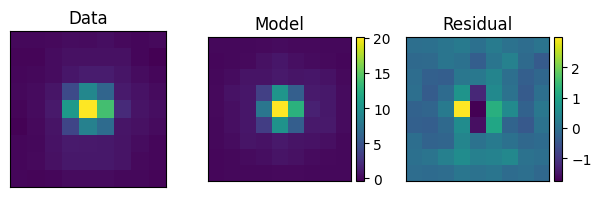

Elapsed Time for Photometry: 28.598962217999997
Starting 6.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.70685634, -69.4443469)>
Setting up sim to match ./mast/01171/jw01171004001_02101_00004_mirimage_cal.fits



MAST OPD query around UTC: 2022-04-13T03:08:10.578
                        MJD: 59682.13067798611

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/R2022041201-NRCA3_FP1-2.fits
	Date (MJD):	 59681.7791
	Delta time:	 -0.3516 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022041301-NRCA3_FP1-1.fits
	Date (MJD):	 59682.8401
	Delta time:	 0.7094 days
User requested choosing OPD time closest in time to 2022-04-13T03:08:10.578, which is R2022041201-NRCA3_FP1-2.fits, delta time -0.352 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/R2022041201-NRCA3_FP1-2.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F560W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(270.41595422), array(532.5810879)) pixels


    Position 1/1 centroid: (201.48318148490097, 201.67877528548456)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(223.73759419), array(494.82246558)) pixels


    Position 1/1 centroid: (201.46004203820556, 201.71187188567248)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(267.35045533), array(531.70578858)) pixels


    Position 1/1 centroid: (201.48170115434127, 201.68105645027674)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(220.78866282), array(493.8695383)) pixels


    Position 1/1 centroid: (201.4582998761485, 201.71386890590742)


2025-01-10 19:43:58,064 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2025-01-10 19:43:58,065 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2025-01-10 19:43:58,067 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2025-01-10 19:43:58,069 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2025-01-10 19:43:58,070 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2025-01-10 19:43:58,071 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2025-01-10 19:43:58,072 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2025-01-10 19:43:58,263 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('./temp_psf_dir/cal_data_asn.json',).


2025-01-10 19:43:58,276 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: ./temp_psf_dir
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: False


2025-01-10 19:43:58,277 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2025-01-10 19:43:58,739 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3653a690>,).


2025-01-10 19:43:58,740 - stpipe.Image3Pipeline.tweakreg - INFO - Step skipped.


2025-01-10 19:43:59,643 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3653a690>,).


2025-01-10 19:43:59,643 - stpipe.Image3Pipeline.skymatch - INFO - Step skipped.


2025-01-10 19:43:59,842 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3653a690>,).


2025-01-10 19:43:59,843 - stpipe.Image3Pipeline.outlier_detection - INFO - Step skipped.


2025-01-10 19:44:00,054 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3653a690>,).


2025-01-10 19:44:00,055 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:44:00,056 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:44:00,056 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:44:00,056 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:44:00,058 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:44:00,058 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:44:00,059 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:44:00,060 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:44:00,061 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:44:00,062 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:44:00,062 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:44:00,062 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:44:00,064 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:44:00,065 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:44:00,065 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:44:00,066 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:44:00,067 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2025-01-10 19:44:00,067 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2025-01-10 19:44:00,068 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2025-01-10 19:44:00,068 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2025-01-10 19:44:00,069 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale: 0.11082930390039995 arcsec.


2025-01-10 19:44:00,089 - stpipe.Image3Pipeline.resample - INFO - Resampling science and variance data


2025-01-10 19:44:00,874 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:00,875 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:00,875 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:01,630 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:01,631 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:01,632 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:02,387 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:02,388 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:02,389 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:03,141 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:03,142 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:03,143 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:03,379 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  80.660307842 -69.452650714 80.735816161 -69.472158466 80.791402231 -69.445614065 80.715936684 -69.426130394


2025-01-10 19:44:03,677 - stpipe.Image3Pipeline.resample - INFO - Saved model in ./temp_psf_dir/temp_psf_cals_i2d.fits


2025-01-10 19:44:03,677 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2025-01-10 19:44:03,875 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(1069, 1070) from temp_psf_cals_i2d.fits>,).


2025-01-10 19:44:03,875 - stpipe.Image3Pipeline.source_catalog - INFO - Step skipped.


2025-01-10 19:44:03,880 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2025-01-10 19:44:03,880 - stpipe - INFO - Results used jwst version: 1.17.1


Finished PSF psf_photometry with median residuals of 6.04%


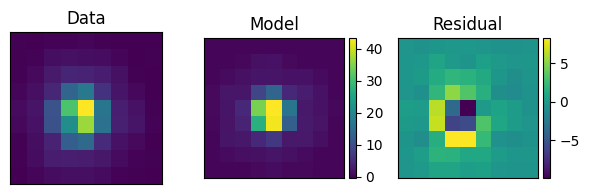

Elapsed Time for Photometry: 28.43476365100014
Starting 7.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.72134362, -69.44277411)>
Setting up sim to match ./mast/01171/jw01171004001_02101_00004_mirimage_cal.fits



MAST OPD query around UTC: 2022-04-13T03:08:10.578
                        MJD: 59682.13067798611

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/R2022041201-NRCA3_FP1-2.fits
	Date (MJD):	 59681.7791
	Delta time:	 -0.3516 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022041301-NRCA3_FP1-1.fits
	Date (MJD):	 59682.8401
	Delta time:	 0.7094 days
User requested choosing OPD time closest in time to 2022-04-13T03:08:10.578, which is R2022041201-NRCA3_FP1-2.fits, delta time -0.352 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/R2022041201-NRCA3_FP1-2.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F560W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(373.59400746), array(671.96205316)) pixels


    Position 1/1 centroid: (201.5026829678264, 201.5823721169552)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(327.06989508), array(634.08704799)) pixels


    Position 1/1 centroid: (201.48931399865492, 201.62647553345647)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(370.53789518), array(671.08033361)) pixels


    Position 1/1 centroid: (201.50109189092134, 201.58495329873404)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(324.13516613), array(633.12828452)) pixels


    Position 1/1 centroid: (201.48809501728533, 201.62914387506436)


2025-01-10 19:44:26,186 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2025-01-10 19:44:26,187 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2025-01-10 19:44:26,190 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2025-01-10 19:44:26,191 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2025-01-10 19:44:26,193 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2025-01-10 19:44:26,194 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2025-01-10 19:44:26,196 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2025-01-10 19:44:26,404 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('./temp_psf_dir/cal_data_asn.json',).


2025-01-10 19:44:26,417 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: ./temp_psf_dir
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: False


2025-01-10 19:44:26,418 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2025-01-10 19:44:26,910 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbcdeaff250>,).


2025-01-10 19:44:26,911 - stpipe.Image3Pipeline.tweakreg - INFO - Step skipped.


2025-01-10 19:44:27,816 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbcdeaff250>,).


2025-01-10 19:44:27,816 - stpipe.Image3Pipeline.skymatch - INFO - Step skipped.


2025-01-10 19:44:28,021 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbcdeaff250>,).


2025-01-10 19:44:28,022 - stpipe.Image3Pipeline.outlier_detection - INFO - Step skipped.


2025-01-10 19:44:28,231 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbcdeaff250>,).


2025-01-10 19:44:28,232 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:44:28,233 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:44:28,233 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:44:28,233 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:44:28,235 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:44:28,236 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:44:28,236 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:44:28,237 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:44:28,238 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:44:28,239 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:44:28,239 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:44:28,240 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:44:28,241 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:44:28,242 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:44:28,242 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:44:28,242 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:44:28,244 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2025-01-10 19:44:28,244 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2025-01-10 19:44:28,245 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2025-01-10 19:44:28,245 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2025-01-10 19:44:28,246 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale: 0.11082930390039995 arcsec.


2025-01-10 19:44:28,264 - stpipe.Image3Pipeline.resample - INFO - Resampling science and variance data


2025-01-10 19:44:29,060 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:29,062 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:29,062 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:29,815 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:29,816 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:29,816 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:30,587 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:30,588 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:30,588 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:31,340 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:31,341 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:31,341 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:31,581 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  80.660307842 -69.452650714 80.735816161 -69.472158466 80.791402231 -69.445614065 80.715936684 -69.426130394


2025-01-10 19:44:31,881 - stpipe.Image3Pipeline.resample - INFO - Saved model in ./temp_psf_dir/temp_psf_cals_i2d.fits


2025-01-10 19:44:31,882 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2025-01-10 19:44:32,082 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(1069, 1070) from temp_psf_cals_i2d.fits>,).


2025-01-10 19:44:32,083 - stpipe.Image3Pipeline.source_catalog - INFO - Step skipped.


2025-01-10 19:44:32,087 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2025-01-10 19:44:32,087 - stpipe - INFO - Results used jwst version: 1.17.1


Finished PSF psf_photometry with median residuals of 8.64%


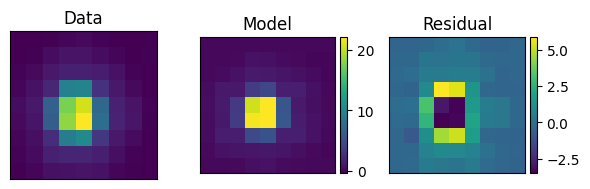

Elapsed Time for Photometry: 28.1140751989999
Starting 8.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.72825681, -69.44591877)>
Setting up sim to match ./mast/01171/jw01171004001_02101_00004_mirimage_cal.fits



MAST OPD query around UTC: 2022-04-13T03:08:10.578
                        MJD: 59682.13067798611

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/R2022041201-NRCA3_FP1-2.fits
	Date (MJD):	 59681.7791
	Delta time:	 -0.3516 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022041301-NRCA3_FP1-1.fits
	Date (MJD):	 59682.8401
	Delta time:	 0.7094 days
User requested choosing OPD time closest in time to 2022-04-13T03:08:10.578, which is R2022041201-NRCA3_FP1-2.fits, delta time -0.352 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/R2022041201-NRCA3_FP1-2.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F560W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(497.07915679), array(636.56018133)) pixels


    Position 1/1 centroid: (201.55654052604694, 201.50798657049626)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(450.65743722), array(598.62155656)) pixels


    Position 1/1 centroid: (201.5514889975097, 201.5227304000734)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(494.02825067), array(635.6772768)) pixels


    Position 1/1 centroid: (201.55621458552167, 201.50830983444305)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(447.73086169), array(597.66099949)) pixels


    Position 1/1 centroid: (201.55071986429965, 201.52465749975383)


2025-01-10 19:44:53,676 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2025-01-10 19:44:53,677 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2025-01-10 19:44:53,680 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2025-01-10 19:44:53,681 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2025-01-10 19:44:53,683 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2025-01-10 19:44:53,684 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2025-01-10 19:44:53,685 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2025-01-10 19:44:53,886 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('./temp_psf_dir/cal_data_asn.json',).


2025-01-10 19:44:53,899 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: ./temp_psf_dir
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: False


2025-01-10 19:44:53,900 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2025-01-10 19:44:54,378 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3b23e890>,).


2025-01-10 19:44:54,379 - stpipe.Image3Pipeline.tweakreg - INFO - Step skipped.


2025-01-10 19:44:55,283 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3b23e890>,).


2025-01-10 19:44:55,284 - stpipe.Image3Pipeline.skymatch - INFO - Step skipped.


2025-01-10 19:44:55,481 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3b23e890>,).


2025-01-10 19:44:55,481 - stpipe.Image3Pipeline.outlier_detection - INFO - Step skipped.


2025-01-10 19:44:55,681 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3b23e890>,).


2025-01-10 19:44:55,682 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:44:55,683 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:44:55,684 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:44:55,684 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:44:55,686 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:44:55,686 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:44:55,686 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:44:55,687 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:44:55,689 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:44:55,689 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:44:55,690 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:44:55,690 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:44:55,692 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:44:55,692 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:44:55,692 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:44:55,693 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:44:55,695 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2025-01-10 19:44:55,695 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2025-01-10 19:44:55,696 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2025-01-10 19:44:55,696 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2025-01-10 19:44:55,696 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale: 0.11082930390039995 arcsec.


2025-01-10 19:44:55,718 - stpipe.Image3Pipeline.resample - INFO - Resampling science and variance data


2025-01-10 19:44:56,535 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:56,536 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:56,537 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:57,290 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:57,291 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:57,291 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:58,048 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:58,049 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:58,050 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:58,793 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:58,794 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:58,794 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:44:59,033 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  80.660307842 -69.452650714 80.735816161 -69.472158466 80.791402231 -69.445614065 80.715936684 -69.426130394


2025-01-10 19:44:59,333 - stpipe.Image3Pipeline.resample - INFO - Saved model in ./temp_psf_dir/temp_psf_cals_i2d.fits


2025-01-10 19:44:59,334 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2025-01-10 19:44:59,526 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(1069, 1070) from temp_psf_cals_i2d.fits>,).


2025-01-10 19:44:59,526 - stpipe.Image3Pipeline.source_catalog - INFO - Step skipped.


2025-01-10 19:44:59,530 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2025-01-10 19:44:59,530 - stpipe - INFO - Results used jwst version: 1.17.1


Finished PSF psf_photometry with median residuals of 8.31%


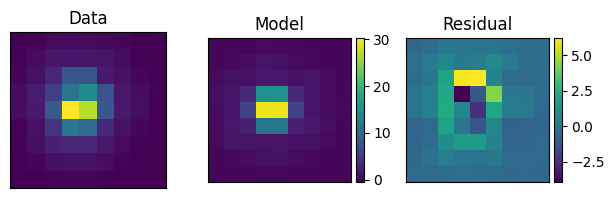

Elapsed Time for Photometry: 27.752272253
Starting 9.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.73139798, -69.44867697)>
Setting up sim to match ./mast/01171/jw01171004001_02101_00004_mirimage_cal.fits



MAST OPD query around UTC: 2022-04-13T03:08:10.578
                        MJD: 59682.13067798611

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/R2022041201-NRCA3_FP1-2.fits
	Date (MJD):	 59681.7791
	Delta time:	 -0.3516 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022041301-NRCA3_FP1-1.fits
	Date (MJD):	 59682.8401
	Delta time:	 0.7094 days
User requested choosing OPD time closest in time to 2022-04-13T03:08:10.578, which is R2022041201-NRCA3_FP1-2.fits, delta time -0.352 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/R2022041201-NRCA3_FP1-2.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F560W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(578.521951), array(585.52745358)) pixels


    Position 1/1 centroid: (201.5640866023399, 201.51164222525637)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(532.1182843), array(547.56588162)) pixels


    Position 1/1 centroid: (201.5653042561024, 201.50931218587124)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(575.47051017), array(584.6454609)) pixels


    Position 1/1 centroid: (201.56415771606822, 201.51111219755308)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(529.19263402), array(546.60566468)) pixels


    Position 1/1 centroid: (201.5653423401724, 201.5092672199106)


2025-01-10 19:45:21,341 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2025-01-10 19:45:21,342 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2025-01-10 19:45:21,345 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2025-01-10 19:45:21,347 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2025-01-10 19:45:21,348 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2025-01-10 19:45:21,349 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2025-01-10 19:45:21,351 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2025-01-10 19:45:21,549 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('./temp_psf_dir/cal_data_asn.json',).


2025-01-10 19:45:21,562 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: ./temp_psf_dir
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: False


2025-01-10 19:45:21,562 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2025-01-10 19:45:22,040 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3ae18f50>,).


2025-01-10 19:45:22,041 - stpipe.Image3Pipeline.tweakreg - INFO - Step skipped.


2025-01-10 19:45:22,952 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3ae18f50>,).


2025-01-10 19:45:22,953 - stpipe.Image3Pipeline.skymatch - INFO - Step skipped.


2025-01-10 19:45:23,153 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3ae18f50>,).


2025-01-10 19:45:23,154 - stpipe.Image3Pipeline.outlier_detection - INFO - Step skipped.


2025-01-10 19:45:23,349 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd3ae18f50>,).


2025-01-10 19:45:23,350 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:45:23,350 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:45:23,351 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:45:23,351 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:45:23,353 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:45:23,353 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:45:23,354 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:45:23,354 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:45:23,356 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:45:23,356 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:45:23,357 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:45:23,357 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:45:23,359 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:45:23,359 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:45:23,360 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:45:23,360 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:45:23,362 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2025-01-10 19:45:23,362 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2025-01-10 19:45:23,363 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2025-01-10 19:45:23,363 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2025-01-10 19:45:23,364 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale: 0.11082930390039995 arcsec.


2025-01-10 19:45:23,384 - stpipe.Image3Pipeline.resample - INFO - Resampling science and variance data


2025-01-10 19:45:24,170 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:24,171 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:24,171 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:24,917 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:24,918 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:24,918 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:25,674 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:25,675 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:25,676 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:26,423 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:26,424 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:26,424 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:26,661 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  80.660307842 -69.452650714 80.735816161 -69.472158466 80.791402231 -69.445614065 80.715936684 -69.426130394


2025-01-10 19:45:26,958 - stpipe.Image3Pipeline.resample - INFO - Saved model in ./temp_psf_dir/temp_psf_cals_i2d.fits


2025-01-10 19:45:26,959 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2025-01-10 19:45:27,160 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(1069, 1070) from temp_psf_cals_i2d.fits>,).


2025-01-10 19:45:27,160 - stpipe.Image3Pipeline.source_catalog - INFO - Step skipped.


2025-01-10 19:45:27,164 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2025-01-10 19:45:27,164 - stpipe - INFO - Results used jwst version: 1.17.1


Finished PSF psf_photometry with median residuals of 9.78%


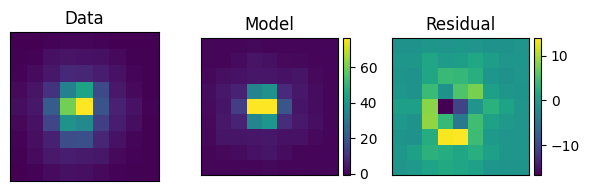

Elapsed Time for Photometry: 27.36825168700011
Starting 10.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.72803877, -69.45133743)>
Setting up sim to match ./mast/01171/jw01171004001_02101_00004_mirimage_cal.fits



MAST OPD query around UTC: 2022-04-13T03:08:10.578
                        MJD: 59682.13067798611

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/R2022041201-NRCA3_FP1-2.fits
	Date (MJD):	 59681.7791
	Delta time:	 -0.3516 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022041301-NRCA3_FP1-1.fits
	Date (MJD):	 59682.8401
	Delta time:	 0.7094 days
User requested choosing OPD time closest in time to 2022-04-13T03:08:10.578, which is R2022041201-NRCA3_FP1-2.fits, delta time -0.352 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/R2022041201-NRCA3_FP1-2.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F560W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(598.56497101), array(492.7352119)) pixels


    Position 1/1 centroid: (201.55632224320937, 201.52934645590085)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(552.20348893), array(454.82466592)) pixels


    Position 1/1 centroid: (201.55531343876754, 201.52866001727517)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(595.51406166), array(491.85750236)) pixels


    Position 1/1 centroid: (201.55655193667363, 201.52882781672005)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(549.27809811), array(453.86828958)) pixels


    Position 1/1 centroid: (201.55539067072684, 201.528499803373)


2025-01-10 19:45:48,797 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2025-01-10 19:45:48,798 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2025-01-10 19:45:48,801 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2025-01-10 19:45:48,802 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2025-01-10 19:45:48,804 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2025-01-10 19:45:48,805 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2025-01-10 19:45:48,807 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2025-01-10 19:45:49,008 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('./temp_psf_dir/cal_data_asn.json',).


2025-01-10 19:45:49,021 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: ./temp_psf_dir
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: False


2025-01-10 19:45:49,022 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2025-01-10 19:45:49,507 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd368ae1d0>,).


2025-01-10 19:45:49,507 - stpipe.Image3Pipeline.tweakreg - INFO - Step skipped.


2025-01-10 19:45:50,408 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd368ae1d0>,).


2025-01-10 19:45:50,409 - stpipe.Image3Pipeline.skymatch - INFO - Step skipped.


2025-01-10 19:45:50,610 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd368ae1d0>,).


2025-01-10 19:45:50,611 - stpipe.Image3Pipeline.outlier_detection - INFO - Step skipped.


2025-01-10 19:45:50,807 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd368ae1d0>,).


2025-01-10 19:45:50,807 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:45:50,808 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:45:50,808 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:45:50,809 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:45:50,811 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:45:50,811 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:45:50,812 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:45:50,812 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:45:50,814 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:45:50,814 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:45:50,815 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:45:50,815 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:45:50,817 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:45:50,817 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:45:50,817 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:45:50,818 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:45:50,819 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2025-01-10 19:45:50,820 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2025-01-10 19:45:50,820 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2025-01-10 19:45:50,820 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2025-01-10 19:45:50,821 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale: 0.11082930390039995 arcsec.


2025-01-10 19:45:50,839 - stpipe.Image3Pipeline.resample - INFO - Resampling science and variance data


2025-01-10 19:45:51,629 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:51,630 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:51,631 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:52,375 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:52,376 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:52,377 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:53,122 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:53,123 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:53,124 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:53,867 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:53,868 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:53,868 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:45:54,116 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  80.660307842 -69.452650714 80.735816161 -69.472158466 80.791402231 -69.445614065 80.715936684 -69.426130394


2025-01-10 19:45:54,417 - stpipe.Image3Pipeline.resample - INFO - Saved model in ./temp_psf_dir/temp_psf_cals_i2d.fits


2025-01-10 19:45:54,418 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2025-01-10 19:45:54,615 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(1069, 1070) from temp_psf_cals_i2d.fits>,).


2025-01-10 19:45:54,616 - stpipe.Image3Pipeline.source_catalog - INFO - Step skipped.


2025-01-10 19:45:54,620 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2025-01-10 19:45:54,620 - stpipe - INFO - Results used jwst version: 1.17.1


Finished PSF psf_photometry with median residuals of 4.16%


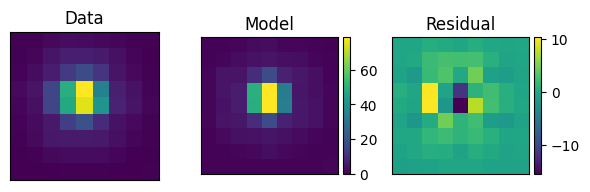

Elapsed Time for Photometry: 27.479921640000157
Starting 11.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.73746115, -69.44890936)>
Setting up sim to match ./mast/01171/jw01171004001_02101_00004_mirimage_cal.fits



MAST OPD query around UTC: 2022-04-13T03:08:10.578
                        MJD: 59682.13067798611

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/R2022041201-NRCA3_FP1-2.fits
	Date (MJD):	 59681.7791
	Delta time:	 -0.3516 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022041301-NRCA3_FP1-1.fits
	Date (MJD):	 59682.8401
	Delta time:	 0.7094 days
User requested choosing OPD time closest in time to 2022-04-13T03:08:10.578, which is R2022041201-NRCA3_FP1-2.fits, delta time -0.352 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/R2022041201-NRCA3_FP1-2.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F560W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(638.6377912), array(620.70166505)) pixels


    Position 1/1 centroid: (201.5642192535976, 201.52917460178813)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(592.17544088), array(582.67409601)) pixels


    Position 1/1 centroid: (201.56371672425522, 201.51489308455942)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(635.58281301), array(619.81693016)) pixels


    Position 1/1 centroid: (201.56411972189602, 201.5280179079131)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(589.24767918), array(581.71091384)) pixels


    Position 1/1 centroid: (201.5638041632133, 201.5142355439668)


2025-01-10 19:46:16,110 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2025-01-10 19:46:16,111 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2025-01-10 19:46:16,114 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2025-01-10 19:46:16,115 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2025-01-10 19:46:16,117 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2025-01-10 19:46:16,119 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2025-01-10 19:46:16,120 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2025-01-10 19:46:16,330 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('./temp_psf_dir/cal_data_asn.json',).


2025-01-10 19:46:16,344 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: ./temp_psf_dir
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: False


2025-01-10 19:46:16,345 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2025-01-10 19:46:16,830 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbcddfc8850>,).


2025-01-10 19:46:16,831 - stpipe.Image3Pipeline.tweakreg - INFO - Step skipped.


2025-01-10 19:46:17,738 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbcddfc8850>,).


2025-01-10 19:46:17,739 - stpipe.Image3Pipeline.skymatch - INFO - Step skipped.


2025-01-10 19:46:17,948 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbcddfc8850>,).


2025-01-10 19:46:17,949 - stpipe.Image3Pipeline.outlier_detection - INFO - Step skipped.


2025-01-10 19:46:18,161 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbcddfc8850>,).


2025-01-10 19:46:18,162 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:46:18,163 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:46:18,163 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:46:18,164 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:46:18,165 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:46:18,165 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:46:18,166 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:46:18,166 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:46:18,168 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:46:18,168 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:46:18,168 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:46:18,169 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:46:18,170 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:46:18,171 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:46:18,171 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:46:18,172 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:46:18,173 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2025-01-10 19:46:18,174 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2025-01-10 19:46:18,175 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2025-01-10 19:46:18,175 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2025-01-10 19:46:18,175 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale: 0.11082930390039995 arcsec.


2025-01-10 19:46:18,193 - stpipe.Image3Pipeline.resample - INFO - Resampling science and variance data


2025-01-10 19:46:18,989 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:18,991 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:18,991 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:19,753 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:19,754 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:19,755 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:20,517 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:20,519 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:20,519 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:21,267 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:21,269 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:21,269 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:21,510 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  80.660307842 -69.452650714 80.735816161 -69.472158466 80.791402231 -69.445614065 80.715936684 -69.426130394


2025-01-10 19:46:21,816 - stpipe.Image3Pipeline.resample - INFO - Saved model in ./temp_psf_dir/temp_psf_cals_i2d.fits


2025-01-10 19:46:21,816 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2025-01-10 19:46:22,030 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(1069, 1070) from temp_psf_cals_i2d.fits>,).


2025-01-10 19:46:22,031 - stpipe.Image3Pipeline.source_catalog - INFO - Step skipped.


2025-01-10 19:46:22,037 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2025-01-10 19:46:22,038 - stpipe - INFO - Results used jwst version: 1.17.1


Finished PSF psf_photometry with median residuals of 2.83%


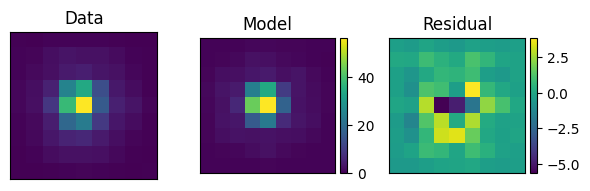

Elapsed Time for Photometry: 27.464163815999882
Starting 12.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.74187347, -69.44817923)>
Setting up sim to match ./mast/01171/jw01171004001_02101_00004_mirimage_cal.fits



MAST OPD query around UTC: 2022-04-13T03:08:10.578
                        MJD: 59682.13067798611

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/R2022041201-NRCA3_FP1-2.fits
	Date (MJD):	 59681.7791
	Delta time:	 -0.3516 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022041301-NRCA3_FP1-1.fits
	Date (MJD):	 59682.8401
	Delta time:	 0.7094 days
User requested choosing OPD time closest in time to 2022-04-13T03:08:10.578, which is R2022041201-NRCA3_FP1-2.fits, delta time -0.352 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/R2022041201-NRCA3_FP1-2.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F560W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(665.28250869), array(669.9804073)) pixels


    Position 1/1 centroid: (201.57008276659948, 201.54576814039473)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(618.76313027), array(631.90069339)) pixels


    Position 1/1 centroid: (201.56412107740027, 201.52297642823274)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(662.22483906), array(669.09280989)) pixels


    Position 1/1 centroid: (201.56972254047167, 201.54452557234018)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(615.83342367), array(630.93459203)) pixels


    Position 1/1 centroid: (201.56400499580542, 201.52193437905086)


2025-01-10 19:46:43,513 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2025-01-10 19:46:43,514 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2025-01-10 19:46:43,516 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2025-01-10 19:46:43,517 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2025-01-10 19:46:43,519 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2025-01-10 19:46:43,520 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2025-01-10 19:46:43,521 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2025-01-10 19:46:43,725 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('./temp_psf_dir/cal_data_asn.json',).


2025-01-10 19:46:43,738 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: ./temp_psf_dir
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: False


2025-01-10 19:46:43,739 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2025-01-10 19:46:44,224 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd84c9a850>,).


2025-01-10 19:46:44,225 - stpipe.Image3Pipeline.tweakreg - INFO - Step skipped.


2025-01-10 19:46:45,128 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd84c9a850>,).


2025-01-10 19:46:45,129 - stpipe.Image3Pipeline.skymatch - INFO - Step skipped.


2025-01-10 19:46:45,334 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd84c9a850>,).


2025-01-10 19:46:45,335 - stpipe.Image3Pipeline.outlier_detection - INFO - Step skipped.


2025-01-10 19:46:45,538 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbd84c9a850>,).


2025-01-10 19:46:45,539 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:46:45,539 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:46:45,539 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:46:45,540 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:46:45,542 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:46:45,542 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:46:45,542 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:46:45,543 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:46:45,545 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:46:45,545 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:46:45,546 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:46:45,546 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:46:45,548 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:46:45,548 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:46:45,549 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:46:45,549 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:46:45,551 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2025-01-10 19:46:45,552 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2025-01-10 19:46:45,552 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2025-01-10 19:46:45,552 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2025-01-10 19:46:45,553 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale: 0.11082930390039995 arcsec.


2025-01-10 19:46:45,571 - stpipe.Image3Pipeline.resample - INFO - Resampling science and variance data


2025-01-10 19:46:46,357 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:46,359 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:46,359 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:47,103 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:47,104 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:47,104 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:47,856 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:47,858 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:47,858 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:48,605 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:48,606 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:48,606 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:46:48,847 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  80.660307842 -69.452650714 80.735816161 -69.472158466 80.791402231 -69.445614065 80.715936684 -69.426130394


2025-01-10 19:46:49,146 - stpipe.Image3Pipeline.resample - INFO - Saved model in ./temp_psf_dir/temp_psf_cals_i2d.fits


2025-01-10 19:46:49,147 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2025-01-10 19:46:49,347 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(1069, 1070) from temp_psf_cals_i2d.fits>,).


2025-01-10 19:46:49,348 - stpipe.Image3Pipeline.source_catalog - INFO - Step skipped.


2025-01-10 19:46:49,352 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2025-01-10 19:46:49,352 - stpipe - INFO - Results used jwst version: 1.17.1


Finished PSF psf_photometry with median residuals of 58.59%


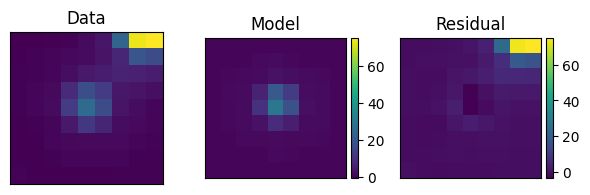

Elapsed Time for Photometry: 27.236165430000028
Starting 13.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.74189746, -69.44834474)>
Setting up sim to match ./mast/01171/jw01171004001_02101_00004_mirimage_cal.fits



MAST OPD query around UTC: 2022-04-13T03:08:10.578
                        MJD: 59682.13067798611

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/R2022041201-NRCA3_FP1-2.fits
	Date (MJD):	 59681.7791
	Delta time:	 -0.3516 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022041301-NRCA3_FP1-1.fits
	Date (MJD):	 59682.8401
	Delta time:	 0.7094 days
User requested choosing OPD time closest in time to 2022-04-13T03:08:10.578, which is R2022041201-NRCA3_FP1-2.fits, delta time -0.352 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/R2022041201-NRCA3_FP1-2.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F560W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(668.66091354), array(665.79422596)) pixels


    Position 1/1 centroid: (201.5699569719903, 201.54634877851865)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(622.14131818), array(627.7148714)) pixels


    Position 1/1 centroid: (201.56415520563206, 201.52397148875409)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(665.60311112), array(664.90677443)) pixels


    Position 1/1 centroid: (201.56950199341014, 201.54492321615234)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(619.21151073), array(626.74888407)) pixels


    Position 1/1 centroid: (201.56405184638245, 201.5229082226684)


2025-01-10 19:47:10,736 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2025-01-10 19:47:10,738 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2025-01-10 19:47:10,740 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2025-01-10 19:47:10,741 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2025-01-10 19:47:10,743 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2025-01-10 19:47:10,744 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2025-01-10 19:47:10,745 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2025-01-10 19:47:10,944 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('./temp_psf_dir/cal_data_asn.json',).


2025-01-10 19:47:10,957 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: ./temp_psf_dir
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: False


2025-01-10 19:47:10,958 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2025-01-10 19:47:11,441 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbcde430290>,).


2025-01-10 19:47:11,442 - stpipe.Image3Pipeline.tweakreg - INFO - Step skipped.


2025-01-10 19:47:12,342 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbcde430290>,).


2025-01-10 19:47:12,343 - stpipe.Image3Pipeline.skymatch - INFO - Step skipped.


2025-01-10 19:47:12,553 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbcde430290>,).


2025-01-10 19:47:12,554 - stpipe.Image3Pipeline.outlier_detection - INFO - Step skipped.


2025-01-10 19:47:12,761 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7fbcde430290>,).


2025-01-10 19:47:12,763 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:47:12,764 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:47:12,764 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:47:12,765 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:47:12,766 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:47:12,767 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:47:12,767 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:47:12,767 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:47:12,769 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:47:12,769 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:47:12,770 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:47:12,770 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:47:12,772 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2025-01-10 19:47:12,772 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2025-01-10 19:47:12,772 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2025-01-10 19:47:12,773 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2025-01-10 19:47:12,775 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2025-01-10 19:47:12,775 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2025-01-10 19:47:12,775 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2025-01-10 19:47:12,776 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2025-01-10 19:47:12,776 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale: 0.11082930390039995 arcsec.


2025-01-10 19:47:12,794 - stpipe.Image3Pipeline.resample - INFO - Resampling science and variance data


2025-01-10 19:47:13,581 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:47:13,582 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:47:13,583 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2025-01-10 19:47:14,331 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:47:14,333 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:47:14,333 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2025-01-10 19:47:15,086 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:47:15,088 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:47:15,089 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2025-01-10 19:47:15,844 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:47:15,845 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:47:15,846 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2025-01-10 19:47:16,085 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  80.660307842 -69.452650714 80.735816161 -69.472158466 80.791402231 -69.445614065 80.715936684 -69.426130394


2025-01-10 19:47:16,386 - stpipe.Image3Pipeline.resample - INFO - Saved model in ./temp_psf_dir/temp_psf_cals_i2d.fits


2025-01-10 19:47:16,386 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2025-01-10 19:47:16,586 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(1069, 1070) from temp_psf_cals_i2d.fits>,).


2025-01-10 19:47:16,587 - stpipe.Image3Pipeline.source_catalog - INFO - Step skipped.


2025-01-10 19:47:16,591 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2025-01-10 19:47:16,591 - stpipe - INFO - Results used jwst version: 1.17.1


Finished PSF psf_photometry with median residuals of 11.89%


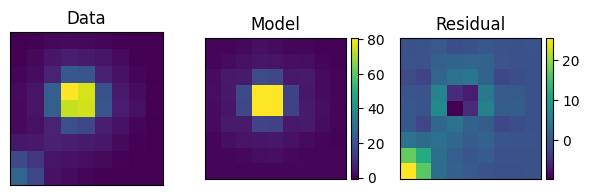

Elapsed Time for Photometry: 27.28789321699992


In [70]:
# Now Loop Through All Stars and Build Photometry Table
counter = 0.
badindex = []

for source_location in skycoords:
    tic = time.perf_counter()
    print('Starting', counter+1., ' of', len(skycoords), ':', source_location)
    psf3 = space_phot.get_jwst3_psf(jwst_obs, jwst3_obs, source_location, num_psfs=4)
    jwst3_obs.psf_photometry(psf3, source_location, bounds={'flux': [-10000, 10000],
                             'centroid': [-2, 2],
                             'bkg': [0, 50]},
                             fit_width=9,
                             fit_bkg=True,
                             fit_flux=True)

    jwst3_obs.plot_psf_fit()
    plt.show()

    ra = jwst3_obs.psf_result.phot_cal_table['ra'][0]
    dec = jwst3_obs.psf_result.phot_cal_table['dec'][0]
    mag_lvl3psf = jwst3_obs.psf_result.phot_cal_table['mag'][0]
    magerr_lvl3psf = jwst3_obs.psf_result.phot_cal_table['magerr'][0]

    if counter == 0:
        df = pd.DataFrame(np.array([[ra, dec, mag_lvl3psf, magerr_lvl3psf]]), columns=['ra', 'dec', 'mag', 'magerr'])
    else:
        df = pd.concat([df, pd.DataFrame(np.array([[ra, dec, mag_lvl3psf, magerr_lvl3psf]]), columns=['ra', 'dec', 'mag', 'magerr'])], ignore_index=True)
    counter = counter + 1.
    toc = time.perf_counter()
    print("Elapsed Time for Photometry:", toc - tic)

In [71]:
lvl2

['./mast/01171/jw01171004001_02101_00004_mirimage_cal.fits',
 './mast/01171/jw01171004001_02101_00003_mirimage_cal.fits',
 './mast/01171/jw01171004001_02101_00002_mirimage_cal.fits',
 './mast/01171/jw01171004001_02101_00001_mirimage_cal.fits']

**Important Note**: When not to use. Due to the sensitivity of the space_phot parameters, this tool is not meant to be used for a large sample of stars (i.e., Section 5 below). If a user would like to use space_phot on more than one source, they should carefully construct a table of parameters that are carefully refined for each source.

In [72]:
df

,ra,dec,mag,magerr
0,80.687522,-69.445225,18.866232,0.004060
1,80.705201,-69.437531,19.530557,0.003212
2,80.700761,-69.443231,19.597094,0.003080
3,80.704803,-69.441535,19.667044,0.003331
4,80.698027,-69.447544,19.916835,0.005623
5,80.706849,-69.444348,18.836841,0.002551
6,80.721346,-69.442774,19.485592,0.003210
7,80.728253,-69.445914,19.429921,0.002779
8,80.731407,-69.448674,18.320808,0.001761
9,80.728019,-69.451341,18.199165,0.001623


<hr style="border:1px solid gray"> </hr>

<img style="float: center;" src="https://raw.githubusercontent.com/spacetelescope/notebooks/master/assets/stsci_pri_combo_mark_horizonal_white_bkgd.png" alt="Space Telescope Logo" width="200px"/>